<a href="https://colab.research.google.com/github/vivan-doshi/uber-data/blob/main/01_Uber_Pickups_NYC_Algorithmic_EDA_Clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

$\rule{800pt}{20pt}$

# Imports

In [ ]:
import os
import time
from datetime import datetime


import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# plt.style.use('ggplot')

import sklearn

import statsmodels.api as sm

import tensorflow as tf
# tf.keras.utils.set_random_seed(42)

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
os.getcwd()

'/content'

In [ ]:
images_path = '/content/drive/My Drive/DSO_545_Fall_2024/Images'

data_path = '/content/drive/MyDrive/DSO_545_Fall_2024/11_Uber_Pickups_Algorithmic_EDA_and_Explanatory_Regressions_I/Data'

In [ ]:
# tf.keras.preprocessing.image.load_img(os.path.join(images_path, 'Walmart_logo.png'))

$\rule{800pt}{20pt}$


# A Framework For How To Think About Business Analytics Problems

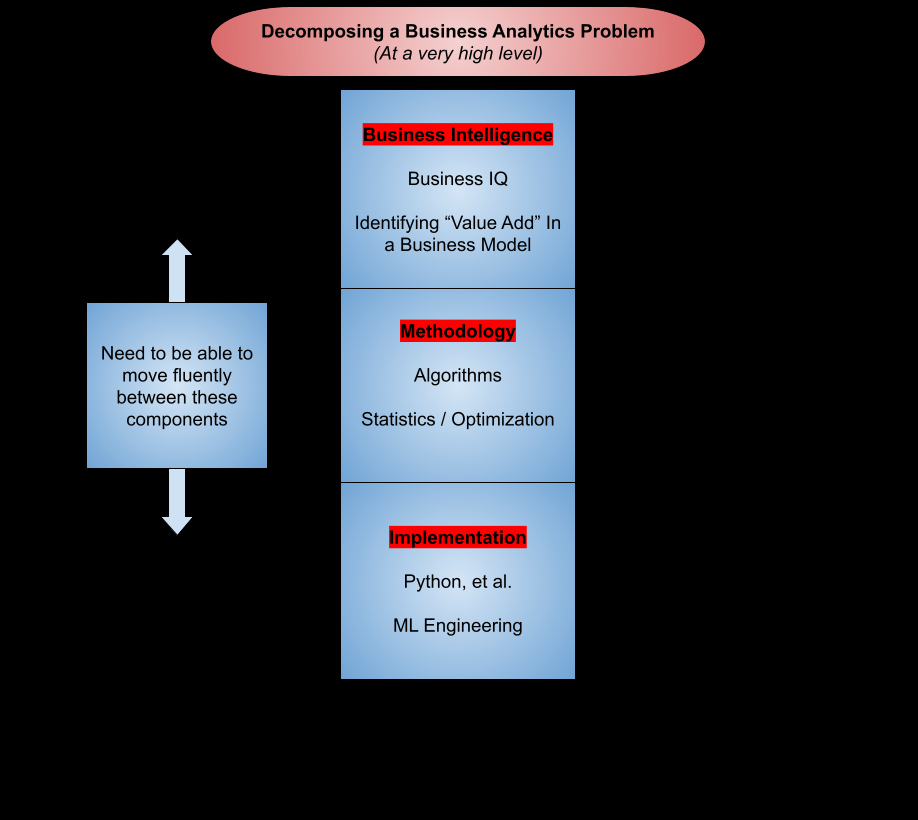

In [ ]:
tf.keras.preprocessing.image.load_img(os.path.join(images_path, 'Outline_for_Decomposing_Analytics_Problems.png'))

$\rule{800pt}{20pt}$

<img src="https://ei.marketwatch.com/Multimedia/2016/08/01/Photos/NS/MW-ES907_didi_u_20160801154402_NS.jpg?uuid=4c17b2d4-5820-11e6-8568-0015c588dfa6">

# Ride-Hailing Platforms
<br>
<font size="+1">
    <ul>
        <li>Ride-hailing platforms such as Uber, Lyft, and DiDi have achieved explosive growth and reshaped urban transportation.</li>
        <br>
        <ul>
            <li>For example, Uber has completed over 10 billion trips globally and is active in over 80 countries and 700 cities since its initial launch in 2009.</li>
            <br>
            <li>By some estimates, the global ride-hailing industry is projected to grow to a 285-billion dollar total market value by 2030.</li>
            <br>
        </ul>
        <li>Ride-hailing platforms connect riders and drivers via a <i>centralized</i> and <i>automated matching and pricing system</i> in a <b>two-sided marketplace</b>.</li>
        <br>
        <li>Ride-hailing platforms have three components:</li>
        <br>
        <ul>
            <li>driver app (for drivers to offer services and communicate with their customers),</li>
            <br>
            <li>rider app (for customers to book and track their journeys and select vehicle types),</li>
            <br>
            <li>and a dispatch system (a system that connects the driver and the customer via their mobile phones).</li>
            <br>
        </ul>
        <li>Relative to taxi services, drivers participating in ride-hailing platforms spend a higher proportion of their time delivering rides.</li>
        <br>
        <ul>
            <li>This is known as having a higher <b><i>capacity utilization rate</i></b>.</li>
            <br>
            <li>In other words, UberX drivers spend less time waiting between ride requests or driving to pick up riders, compared to taxi drivers.</li>
            <br>
            <li>This is typically true on the driver side as well.</li>
            <br>
            <li>Many studies have been conducted and they have found that the average rider waiting time between request and pickup (known as <b><i>rider waiting time</i></b>) can be much lower in a ride-hailing system compared to a street-hailing system.</li>
            <br>
        </ul>
        <font color="blue"><li style="color:blue">The are two key levers in building a successful ride-hailing platform:</li></font>
        <br>
        <ul style="color:blue">
            <font color="blue"><li>matching algorithms, which help to efficiently match riders and drivers,</li>
            <br>
            <li>and dynamic pricing algorithms, which help to keep the supply of drivers and demand of riders in balance.</li></font>
            <br>
        </ul>
        <li>Matching refers to the process of dispatching available drivers to pick up riders.</li>
        <br>
        <ul>
            <li><img src="https://www.uber-assets.com/image/upload/f_auto,q_auto:eco,c_fill,w_956,h_637/v1611193266/assets/58/69b90b-b3a6-412f-a45e-4a28026cd86a/original/2_Better-matching-matters-grey.jpg" width="300"></li>
            <br>
        </ul>
        <li>Dynamic pricing refers to the adjustment of prices for rides over time based on real-time demand and supply conditions.</li>
        <br>
        <ul>
            <li>Dynamic pricing is called <i>surge pricing</i> by Uber and <i>prime time</i> by Lyft.</li>
            <br>
            <li><img src="https://pbs.twimg.com/media/FQJrV5LXIAAclOb?format=jpg&name=900x900" height="300" width="300"></li>
            <br>
        </ul>
        <li>A successful implementation of matching and pricing can be leveraged to create an experience with <b>low waiting times</b> for both riders and drivers.</li>
        <br>
        <font color="dodgerblue"><li style="color:dodgerblue">As an aside:</li></font>
        <br>
        <ul style="color:dodgerblue">
            <font color="dodgerblue"><li>Matching and dynamic pricing algorithms have been leveraged by many other online platforms that connect service providers and consumers.</li>
            <br>
            <li>For example,</li></font>
            <br>
            <ul>
                <font color="dodgerblue"><li><a href="https://www.taskrabbit.com/blog/unveiling-the-new-taskrabbit">TaskRabbit</a> for chores and home projects,</li>
                <br>
                <li><a href="https://www.ebay.com/help/selling/listings/listing-tips/optimising-listings-best-match?id=4166">eBay</a> for e-commerce,</li>
                <br>
                <li><a href="https://www2.aueb.gr/users/mitsopoulou/files/Parking_Percom_camera_ready(1).pdf">SpotHero</a> for parking spaces,</li>
                <br>
                <li>StubHub for concert and sports game tickets,</li>
                <br>
                <li>Turo and Getaround for car-sharing,</li>
                <br>
                <li>and <a href="https://blogs.cornell.edu/info4220/2016/03/18/how-airbnb-uses-matching-markets-to-ensure-host-preferences/">Airbnb</a> for hospitality services.</li></font>
                <br>
            </ul>
            <li>In contrast to ride-hailing, these services provide matching <i>suggestions</i> and price <i>guidance</i> via recommendation systems, but the final decisions are made by the participants on the platform as opposed to the platform itself.</li>
            <br>
            <li>Food and grocery delivery platforms (such as UberEats, Instacard, or Grubhub) are more similar to ride-hailing platforms, but they have more time and flexibility for dispatching due to a lower level of urgency for the service.</li>
            <br>
            <li>The pricing and matching decisions for ride-hailing services need to be resolved in real-time as riders and drivers are sensitive in time.</li>
            <br>
            <li>Matching and pricing algorithms are both optimization problems that can be aided with tools from descriptive analytics!</li>
            <br>
        </ul>
    </ul>
</font>

$\square$

$\rule{800pt}{20pt}$

## An Aside: Matching in Ride-Hailing
<br>
<font size="+1">
    <ul>
        <li>Rides can be either non-shared, meaning that the ride is arranged for only one customer group, or shared, meaning that several customer groups with different pickup and dropoff locations share the ride.</li>
        <br>
        <li>In the simpler case of a non-shared ride, drivers participating on the platform cycle through three states sequentially: </li>
        <br>
        <ul>
            <li><i>"open"</i> (waiting to be dispatched),</li>
            <br>
            <li><i>"en route"</i> (on the way to the pickup location),</li>
            <br>
            <li>and <i>"on-trip"</i> (driving riders to their destination).</li>
            <br>
        </ul>
        <li>A request can be matched with a dispatchable driver using very simple algorithms, such as the <b><i>first-dispatch protocol</i></b>.</li>
        <br>
        <ul>
            <li>In the first-dispatch protocol only open drivers are considered as dispatchable.</li>
            <br>
            <li>Each request is immediately assigned to the open driver who is predicted to have the shortest en route time.</li>
            <br>
            <li>This matching algorithm is also called the <i>on-call</i> policy, the <i>closest driver</i> policy, and the <i>committed driver-rider</i> matching protocol.</li>
            <br>
        </ul>
        <li>An alternative matching approach is <i>batching</i> where rider requests are collected for a short time window (typically on the order of seconds), at the end of which an optimization problem is solved to pair each request with an open driver.</li>
        <br>
        <li>If there are riders that are not matched in this batch, then they are carried over and used for the optimization problem in the next batching window.</li>
        <br>
        <li>Batching can reduce the rider waiting time relative to the <i>first-dispatch</i> protocol by consolidating requests and making better use of supply.</li>
        <br>
        <ul>
            <li>Note that the first-dispatch protocol can be viewed as a special case of the batching protocol when each batch consists of exactly one rider request.</li>
            <br>
        </ul>
        <li>Due to its substantial benefits, batching has been implemented widely in major ride-hailing platforms.</li>
        <br>
    </ul>
</font>

$\square$

$\rule{800pt}{20pt}$

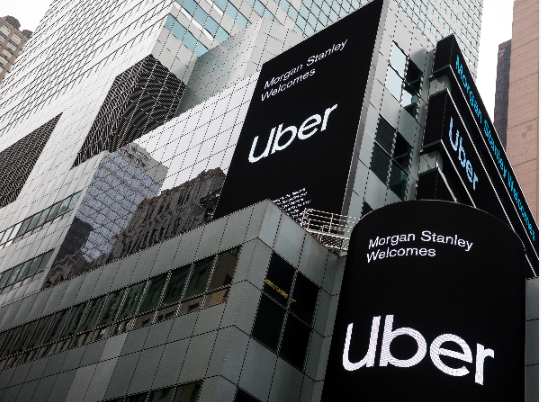

In [ ]:
tf.keras.preprocessing.image.load_img(os.path.join(images_path, 'uber.png'))

# <a href="https://www.uber.com/">Uber Technologies, Inc.</a>
<br>
<font size="+1">
    <ul>
        <li>Uber Technologies Inc. is a peer-to-peer ride-hailing platform.</li>
        <br>
        <li>Uber's platform facilitates the connection between drivers and riders for a fee.</li>
        <br>
        <li>Uber uses advanced analytics, machine learning, optimization, and state-of-the-art engineering to calculate prices that encourage optimal positioning of cars in order to maximize profits.
        </li>
        <br>
        <li>Uber has a connection to USC Marshall DSO department. A former <a href="https://www.hamidnz.net/">DSO professor</a> leads Uber's Marketplace Dynamics Applied Science team which consists of <a href="https://www.uber.com/us/en/drive/driver-app/how-surge-works/">Matching, Surge, and Rider Pricing</a>. See <a href="https://arxiv.org/abs/1905.07544">Driver Surge Pricing</a> for a detailed paper on how to model surge pricing mechanisms.</li>
        <br>
        <a href="https://investor.uber.com/home/default.aspx">Uber Technologies, Inc. Investor Relation Page</a>
        <br>
    </ul>
</font>

$\square$

$\rule{800pt}{20pt}$

## An Aside: <a href="https://www.uber.com/blog/engineering-routing-engine/">Brief History of Uber's Routing Engine and Technological Innovation</a>
<br>
<font size="+1">
    <ul>
        <li>When the Uber app was initially launched around 2010, one of the first features of the app was the ETA (estimated time of arrival) between you and the closest driver.</li>
        <br>
        <li>In the early days, Uber used a combination of different routing engines to produce an ETA, including the <a href="http://project-osrm.org/">Open Source Routing Machine (OSRM)</a>, which is an open source optimal routing package and the entire codebase can be found on <a href="https://github.com/Project-OSRM">GitHub</a>.</li>
        <br>
        <ul>
            <li>Also in the early days, Uber didn't have navigation available in the app, so the app was only used to estimate the ETA and to display vehicle locations.</li>
            <br>
            <li>This service of estimating ETAs was called <i>"GoldETA"</i> and it was a model that was built on top of the routing engines and adjusted the original estimates using Uber's historical data of similar routes.</li>
            <br>
            <li>This solution ultimately took into account hundreds of thousands of Uber trips and compared them to the initial routing engine's ETA.</li>
            <br>
            <li>GoldETA worked better than using any single ETA estimate alone.</li>
            <br>
        </ul>
        <li>The main challenge was the <a href="https://en.wikipedia.org/wiki/Cold_start_(recommender_systems)">cold start</a> problem that Uber faced when they launched in new cities.</li>
        <br>
        <ul>
            <li>Specifically, the cold start problem refers to when you want to use a model without having estimated the model on relevant data, that is, your model starts <i>cold</i>.</li>
            <br>
        </ul>
        <li>Additionally, as Uber grew, they needed to add features to their platform that became difficult to implement due to the integration with the open source codebase OSRM.</li>
        <br>
        <li>These challenges led Uber to develop their own routing engine solution.</li>
        <br>
        <li>This required better ETA prediction and better matching and pricing optimization algorithms.</li>
        <br>
        <li>For more on this development, see <a href="https://www.uber.com/blog/engineering-routing-engine/">this link</a>.</li>
        <br>
    </ul>
</font>

$\square$

## <a href="https://investor.uber.com/home/default.aspx">Uber's Business Model: How Does Uber Make Money?</a>

- <a href="https://investor.uber.com/financials/default.aspx">Uber's financials to understand the business.</a>


- **Gross bookings** are a key financial metric for Uber, representing the total dollar value of all services provided through its platform over a specific period.

- This includes:

  - Ride-hailing Services: Fares paid by riders for transportation.

  - Delivery Services: Payments for food, grocery, and other deliveries via Uber Eats and other delivery offerings.

  - Freight Services: Transactions facilitated through Uber Freight.

  - Other Services: Any additional services offered by Uber.


- Gross bookings are calculated before deductions for:

  - Driver and Courier Earnings: Payments made to drivers and couriers.

  - Driver Incentives and Refunds: Promotions and refunds affecting net revenue.

  - Taxes and Fees: Applicable taxes, tolls, and fees.

  - Gross bookings provide an overview of the total economic activity mediated by Uber's platform, reflecting the company's scale and reach.

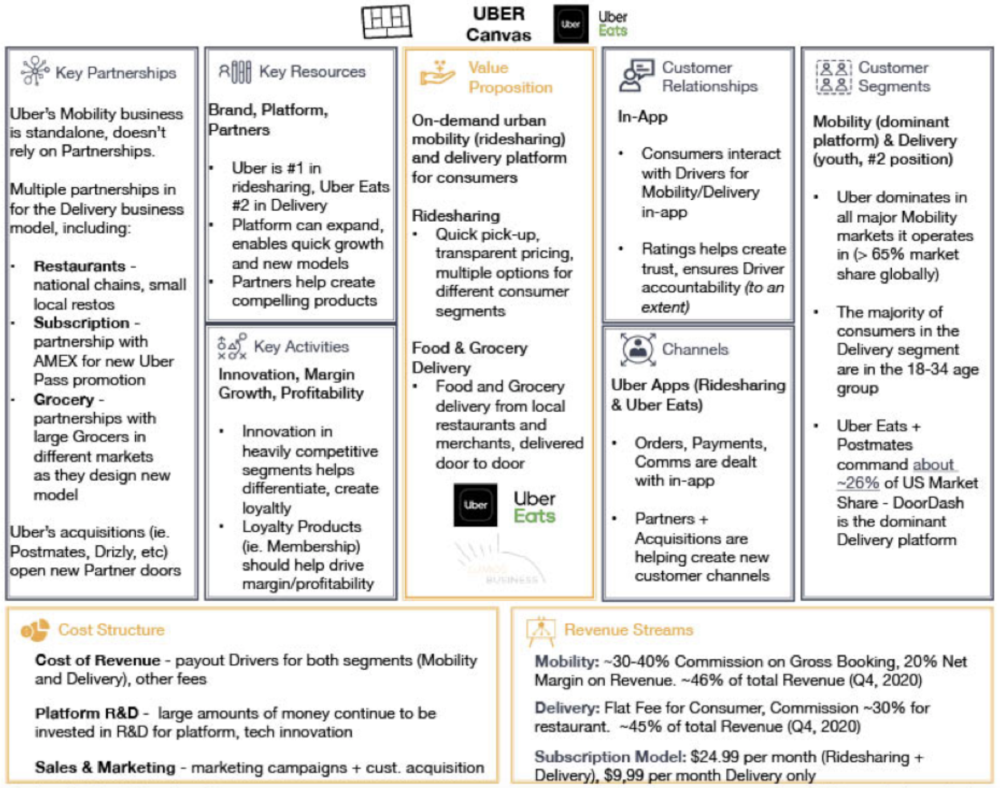

In [ ]:
tf.keras.preprocessing.image.load_img(os.path.join(images_path, 'uber_business_model_canvas.png'))

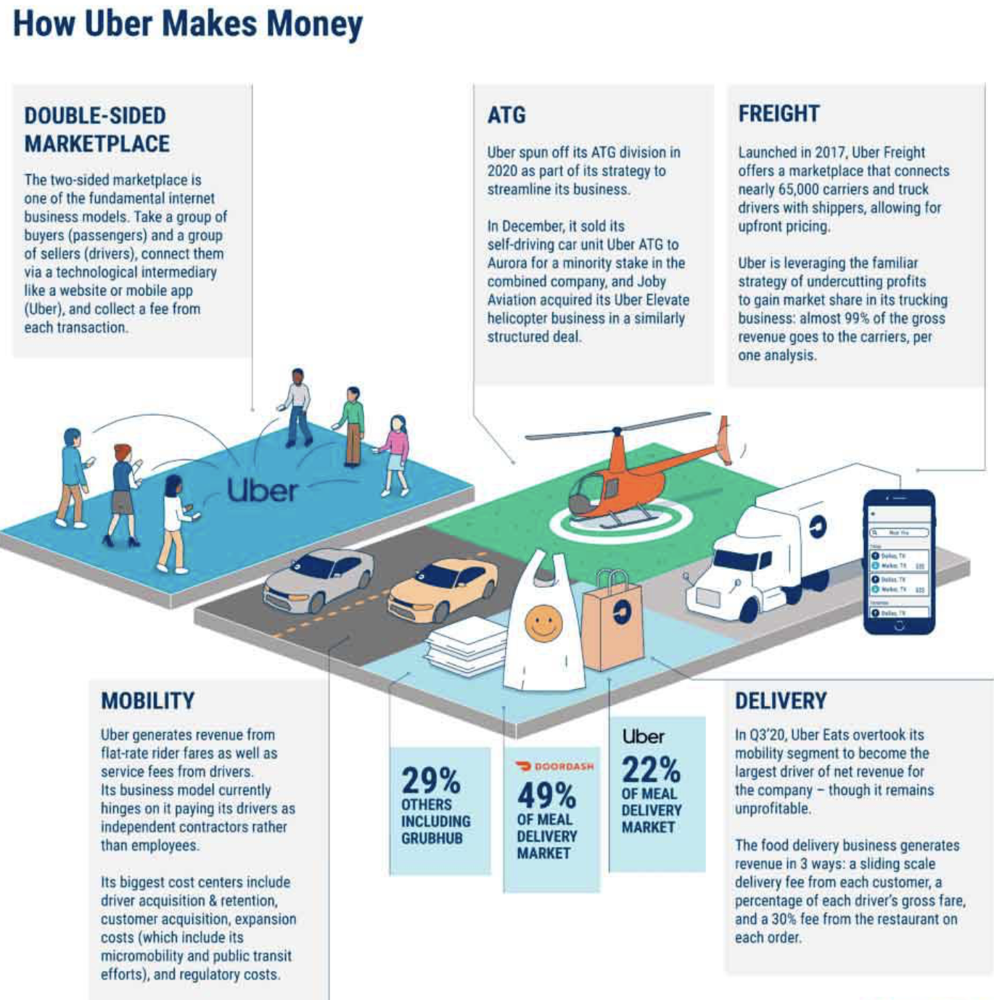

In [ ]:
tf.keras.preprocessing.image.load_img(os.path.join(images_path, 'how_uber_makes_money.png'))

### Uber As A Matching Platform

---
---

- **Two-Sided Marketplace:**

   - **Riders (Demand Side):**
    
    - Individuals who need transportation services can request rides through the Uber app.
   
   - **Drivers (Supply Side):**
   
    - Independent contractors who use their own vehicles to provide rides and earn income.

- **Creation of a Technology Platform that Implements the Two-Sided Marketplace:**

   - **Mobile Application:**
   
    - The core of Uber's service is its user-friendly app that facilitates ride requests, driver dispatch, real-time tracking, and payment processing.

   - **Algorithmic Matching:**
   
    - Advanced algorithms match riders with the nearest available drivers to minimize wait times and optimize route efficiency.
   
   - **Payment Systems:**
   
    - Cashless transactions are processed within the app using stored credit card information or digital wallets.    

---
---  

### Uber's Profit Centers

---
---

- **Revenue Generation:**

  - The company's revenue streams are diversified across various services and geographies. These include:

    - Ride-Hailing Services

      - Uber's primary revenue comes from its ride-hailing platform, where riders are matched with drivers for transportation services.

      - This platform is monetized by charging riders a fare for each trip, from which it takes a commission before paying the driver. The commission typically ranges from 20% to 30% of the total fare.

      - Uber also utilizes surge pricing during periods of high demand to maximize revenue and encourage more drivers to be available.

      - **UberX, UberPOOL, UberBLACK:** Different ride options catering to various customer preferences and price points.

    - Uber Eats (Food Delivery)

      - Uber Eats is a service that connects customers with local restaurants for food delivery.

      - This service is monetized through the use of:

        - Delivery Fees: Charged to customers for each order.

        - Service Fees: Additional fees for order processing.

        - Commission from Restaurants: A percentage (often between 15% to 30%) of the order value is charged to restaurants.
    
    - Uber Freight
      
      - This is a platform that connects shippers with carriers for freight transportation.

      - This matching is monetized by Uber taking a fee for facilitating each shipment, functioning similarly to a brokerage service.

    - Other revenue streams include:

      - Uber for Business: Offers ride management solutions for companies, generating revenue through corporate partnerships.

      - Micro-Mobility Solutions: Rentals of electric bikes and scooters.

      - Uber Health: Non-emergency medical transportation services.
      
      - Advertising: In-app advertising and marketing partnerships.

- Uber's revenue model is multifaceted, relying on various services that connect consumers with transportation, delivery, and logistics solutions.

---
---

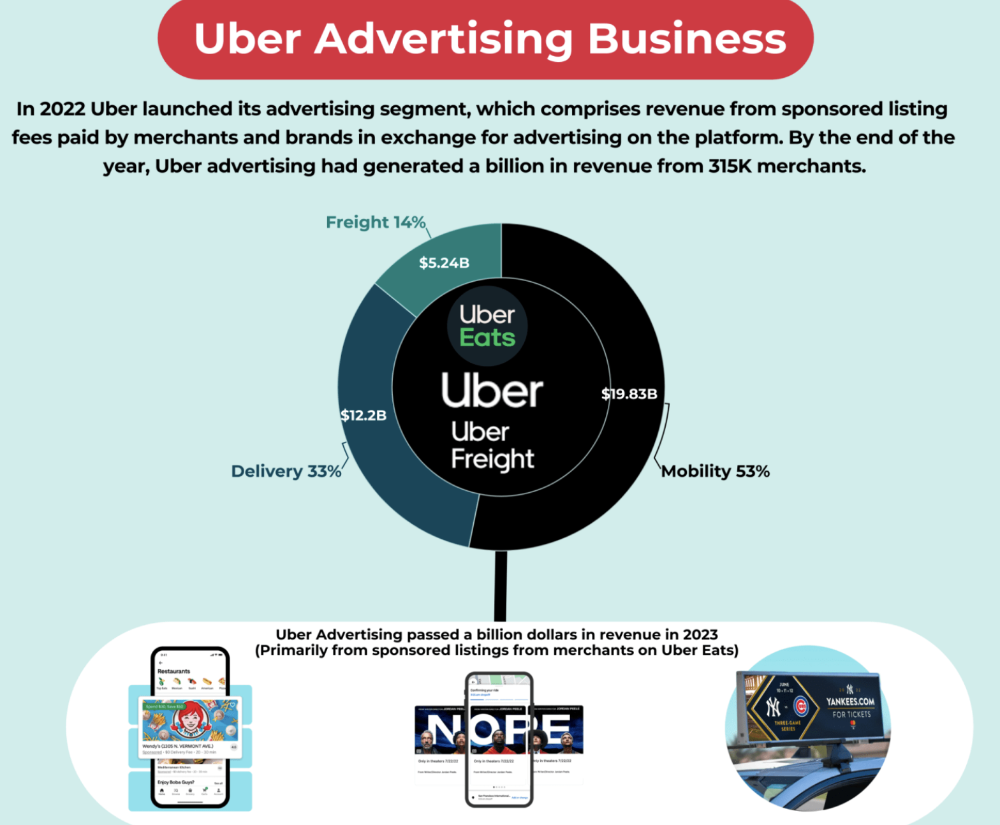

In [ ]:
tf.keras.preprocessing.image.load_img(os.path.join(images_path, 'uber_ads.png'))

### Uber's Cost Centers

---
---

- Cost centers are parts of the business that incur expenses without directly generating profits but are essential for operations and growth.

  - **Driver Incentives and Promotions**

    - These are costs associated with attracting and retaining drivers.

    - **Expenses:**

      - **Sign-up Bonuses:** Incentives for new drivers.

      - **Surge Guarantees:** Ensuring drivers are available during high-demand periods.

      - **Referral Programs:** Rewards for drivers who bring in new drivers or riders.

  - **Research and Development (R&D)**

    - Investments in technology to improve platforms and develop new services.

    - **Expenses:**

      - **Autonomous Vehicle Research:** Significant investments in self-driving technology.

      - **App Development:** Enhancing user experience and platform capabilities.

  - **Marketing and Advertising**

    - Expenses to attract new users and increase brand awareness.

    - **Expenses:**

      - **Digital Advertising:** Online campaigns across various platforms.

      - **Traditional Media:** TV, radio, and print advertisements.

      - **Sponsorships and Events:** Partnering with events to increase visibility.

  - **General and Administrative Expenses**

    - Overhead costs necessary for day-to-day operations.

    - **Expenses:**

      - **Salaries:** For corporate staff, management, and support teams.

      - **Facilities:** Office spaces, utilities, and equipment.

      - **Professional Services:** Legal, accounting, and consulting fees.

  - **Regulatory and Legal Compliance**

    - Costs related to adhering to laws and defending against legal challenges.

    - **Expenses:**

      - **Licensing Fees:** Required permits and licenses in various jurisdictions.

      - **Legal Settlements:** Costs from lawsuits or regulatory fines.

      - **Compliance Programs:** Implementing systems to ensure regulatory adherence.

  - **Customer Support**

    - Services to assist riders and drivers with issues.

    - **Expenses:**

      - **Support Staff:** Personnel handling inquiries and complaints.

      - **Service Centers:** Physical locations for driver support in some markets.

  - **Infrastructure and Platform Maintenance**

    - Costs to maintain and upgrade technological infrastructure.

    - **Expenses:**

      - **Server Costs:** Hosting and data storage.

      - **Cybersecurity:** Protecting user data and platform integrity.

      - **Software Licensing:** Fees for third-party software used in operations.



---
---

### Uber's Growth Initiatives

---
---

- Uber is continually seeking ways to expand its business through various growth strategies.

  - **Geographic Expansion**

    - **Goal:** Enter new cities and countries to increase the user base.

    - **Strategy:** Adapt services to meet local regulations and cultural preferences.

  - **Service Diversification**

    - **Goal:** Offer a broader range of services to meet different consumer needs.

    - **Initiatives:**

      - **Uber Connect:** Parcel delivery services.

      - **Uber Direct:** Retail and grocery delivery partnerships.

      - **Uber Rent:** Car rental services through partnerships.

  - **Technological Innovation**

    - **Autonomous Vehicles**

    - **Goal:** Develop self-driving technology to reduce dependence on drivers and lower operational costs.

    - **Initiatives:** Investments in autonomous vehicle research and partnerships with technology firms.

  - **Electric Mobility**

    - **Goal:** Promote sustainable transportation options.

    - **Initiatives:** Introducing electric vehicles into the fleet, investing in charging infrastructure.

  - **Strategic Partnerships and Acquisitions**

    - **Goal:** Enhance service offerings and enter new markets.

    - **Examples:**

      - **Acquisition of Postmates (2020):** Expanded food delivery capabilities.

      - **Partnerships with Public Transit Agencies:** Integrating public transit options into the app.

  - **Uber for Business**

    - **Goal:** Capture corporate clients by offering tailored ride and meal programs.

    - **Initiatives:** Developing enterprise-level features and reporting tools.

  - **New Offerings**

    - **Uber Health:** Expanding into healthcare transportation.

    - **Uber Boat and Uber Air:** Exploring water and air transportation options in select markets.


  - **Partnerships and Collaborations:**

    - Collaborations with car manufacturers, technology companies, and local businesses to enhance service offerings and integrate new technologies like autonomous vehicles.

      - <a href="https://investor.uber.com/news-events/news/press-release-details/2024/Uber-and-Waymo-Expand-Partnership-to-Bring-Autonomous-Ride-Hailing-to-Austin-and-Atlanta/default.aspx#:~:text=Beginning%20in%20early%202025%2C%20Waymo,grow%20to%20hundreds%20over%20time.">Uber and Waymo Expand Partnership to Bring Autonomous Ride-Hailing to Austin and Atlanta</a>

      - <a href="https://www.uber.com/gb/en/u/uberboat/">Uber Boat by Thames Clippers</a>

- **Competitive Strategy:**

   - **Market Expansion Pricing:** Offering competitive pricing to attract users in new markets.

   - **Innovation:** Investing in technology advancements like AI and machine learning to improve services.

    - <a href="https://www.uber.com/blog/engineering/ai/">How is Uber using AI?</a>

   - **Customer Loyalty Programs:** Implementing rewards programs to retain customers.

---
---

$\rule{800pt}{20pt}$

# Integrating Data and Storytelling: Uber and FiveThirtyEight
<br>
<font size="+1">
    <ul>
        <li>Nate Silver's <a href="https://fivethirtyeight.com/">FiveThirtyEight</a></li>
        <br>
        <ul>
            <li><a href="https://fivethirtyeight.com/features/the-debate-on-ubers-impact-is-far-from-over/">The Debate On Uber’s Impact In New York City Is Far From Over</a></li>
        <br>
            <li><img src="https://fivethirtyeight.com/wp-content/uploads/2015/07/bialik-datalab-uber-1.png?w=610"></li>
            <br>
            <li><a href="https://fivethirtyeight.com/features/uber-is-serving-new-yorks-outer-boroughs-more-than-taxis-are/">Uber is Serving New York's Outer Buroughs More Than Taxis Are</a></li>
            <br>
            <li><img src="https://fivethirtyeight.com/wp-content/uploads/2015/08/uber-datalab-share-map1.png?w=610" height=300 width=300></li>
            <br>
            <li><img src="https://fivethirtyeight.com/wp-content/uploads/2015/08/uber-datalab-hour-of-day.png?w=610" height=300 width=300></li>
            <br>
            <li><a href="https://fivethirtyeight.com/features/public-transit-should-be-ubers-new-best-friend/">Public Transit Should Be Uber's New Best Friend</a></li>
            <br>
            <li><img src="https://fivethirtyeight.com/wp-content/uploads/2015/08/uber-feature-demobreakdown-map-1.png?w=610" height=300 width=300></li>
            <br>
            <li><img src="https://fivethirtyeight.com/wp-content/uploads/2015/08/uber-feature-demobreakdown-borough-2.png?w=305" height=300 width=300></li>
            <br>
            <li><a href="https://fivethirtyeight.com/features/new-yorks-green-cabs-stay-close-to-the-city-center/">New York's Green Cabs Stay Close to the City Center</a></li>
            <br>
            <li><img src="https://fivethirtyeight.com/wp-content/uploads/2015/09/fischerbaum-datalab-greencabs-1.png?w=610" height=300 width=300></li>
            <br>
            <li><a href="https://fivethirtyeight.com/features/uber-is-taking-millions-of-manhattan-rides-away-from-taxis/">Uber is Taking Millions of Manhattan Rides Away From Taxis</a></li>
            <br>
            <li><img src="https://fivethirtyeight.com/wp-content/uploads/2015/10/uber-seasonalchange-1.png?w=305" height=300 width=300></li>
            <br>
            <li><img src="https://fivethirtyeight.com/wp-content/uploads/2015/10/uber-seasonalchange-22.png?w=1024" height=300 width=300></li>
            <br>
            <li><img src="https://fivethirtyeight.com/wp-content/uploads/2015/10/uber-seasonalchange-31.png?w=610" height=300 width=300></li>
            <br>
            <li><a href="https://fivethirtyeight.com/features/is-uber-making-nyc-rush-hour-traffic-worse/">Is Uber Making NYC Rush-Hour Traffic Worse?</a></li>
            <br>
            <li><img src="https://fivethirtyeight.com/wp-content/uploads/2015/12/bialikfischerbaum-ubertime-1.png?w=610" height=300 width=400></li>
            <br>
            <li><img src="https://fivethirtyeight.com/wp-content/uploads/2015/12/bialikfischerbaum-ubertime-2.png?w=610" height=300 width=400></li>
            <br>
            <li><a href="https://fivethirtyeight.com/features/how-ubers-truce-with-regulators-played-out-during-the-dnc/">How Uber’s Truce With Regulators Played Out During The DNC</a></li>
        <br>
            <li><img src="https://fivethirtyeight.com/wp-content/uploads/2016/07/2ae0ab69-c0b7-49d8-8193-b0c49fb9a13e.jpg?w=575"> </li>
            <br>
            <li>Uber’s tent at the Democratic convention in Philadelphia in 2016</li>
            <br>
            <br>
        </ul>
    </ul>
</font>

$\rule{800pt}{20pt}$

# Business Objective
<br>
<font size="+1">
    <ul>
        <li>There is a multitude of ways one can use Uber pickup data for various business objectives related to both Uber's lines of business as well as city planning and regulatory compliance. </li>
        <br>
        <ul>
            <li>Any ideas? Note this question is limited by your creativity as there is no <i>correct</i> answer.</li>
            <br>
        </ul>
        <li>For this notebook, we will focus on a few problems Uber is continually trying to answer.</li>
        <br>
        <ul>
            <li>That is, how to solve the <b>matching</b> and <b>pricing</b> problem between <b>riders</b> and <b>drivers</b>?</li>
            <br>
            <ul>
                <li>This is a common problem faced by any company that facilitates transactions between counterparties, i.e. a marketplace.</li>
                <br>
                <ul>
                  <li>Recall the other marketplaces we have studied.</li>
                  <br>
                  <li>Consider the mechanisms that match buyers to sellers of financial products, i.e. financial exchanges.</li>
                  <br>
                </ul>
                <li>Specifically, a problem Uber faces is that sometimes drivers are not around when users need them.</li>
        <br>
        <li>Even if riders and drivers are not that far away, if users have to wait 10 to 15 minutes before being picked up, then they will likely cancel their ride's pickup request.</li>
        <br>
        <li>Uber's research shows that users have a willingness-to-wait time of 5-7 minutes</li>
        <br>
        <li>Therefore, it is of first-order importance for Uber to have a methodology that is capable of recommending <i>hot-spot zones</i> for drivers to be in major cities in order to help facilitate the successful matching of riders and drivers.</li>
    <br>
                <font color="red"><li style="color:red">Note, these hot-spots can vary by day and intraday hours.</li></font>
                <br>
            </ul>
        </ul>
    </ul>
</font>
<br>

$\rule{800pt}{20pt}$

## First Attempt at a Solution
<br>
<font size="+1">
    <ul style="color:green">
        <font color="green"><li>One attempt at a solution to the rider/driver matching problem is to use <b>clustering algorithms</b> to group pickups together and then, somehow, define those groups (clusters) as <i>hotspots</i> where drivers should be encouraged to hang around.</li>
        <br>
        <li>Once we have our <i><b>rider-pickup clusters</b></i>, we can create a matching rule that assigns a rider's pickup request to a cluster and then broadcasts the pickup request to all drivers in the region defined by the cluster.</li>
        <br>
        <ul>
            <li>Note this solution makes no reference to how to set prices that drivers and riders agree upon to complete the matching; this would be a second analytics task to tackle.</li>
            <br>
        </ul>
        <li>With this first attempt at a solution, we can begin to analyze the pickup data, create clusters, and assign pickups to clusters.</li>
        <br>
        <ul>
            <li>Again, this is far from an optimal solution, but rather a first approximation of a solution that allows us to learn about an algorithmic EDA technique.</li>
        <br>
        </ul>
    </ul>
</font>

$\rule{800pt}{20pt}$

## Analytics to Understand, Monitor, and Improve Uber's Business Model
<br>
<font size="+1">
    <ul>
        <font color="blue"><li><b>We also want to make recommendations on how Uber can increase their market share in taxi-crowded markets, such as New York City.</b></li></font>
        <br>
        <ul>
          <font color="blue"><li>Part of the process of making recommendations is to create a data-driven system that can monitor the impact of taxi demand given the supply of Uber rides.</li></font>
          <br>
        </ul>
        <li>To do this, we to do the following analyses:</li>
        <br>
        <ul>
            <li><b>EDA:</b></li>
            <br>
            <ul>
                <li>Use the data to identify rider and driver patterns.</li>
                <br>
            </ul>
            <li><b>Algorithmic EDA - Clustering Analysis:</b></li>
            <br>
            <ul>
                <li>Identifying high-demand areas aligns with Uber's goal to optimize driver allocation.</li>
                <br>
                <li>Helps in strategic planning for market penetration and service improvement.</li>
                <br>
            </ul>
            <li><b>Regression Analysis for Explanatory and Causal Inference:</b></li>
            <br>
            <ul>
                <li>Estimate the sensitivity of taxi demand to the number of Uber ride offerings.</li>
                <br>
                <li>Helps analyze market penetration and inform strategic platform decisions.</li>
                <br>
            </ul>
        </ul>
    </ul>
</font>
<br>

$\rule{800pt}{20pt}$

# Uber NYC Pickups Data Sets
<br>
<br>
<img src="https://www.bkmag.com/wp-content/uploads/2015/07/uber.jpg">
<br>
<br>
<font size="+1">
    <ul>
        <li>We will be working with a data set containing data generated by Uber from New York City, which is freely available on <a href="https://github.com/fivethirtyeight/uber-tlc-foil-response">FiveThirtyEight's GitHub</a>.</li>
        <br>
        <li>This data was obtained by FiveThirtyEight submitting a Freedom of Information Law request to the <a href="https://www1.nyc.gov/site/tlc/index.page">NYC Taxi & Limousine Commision</a>.</li>
        <br>
        <li>The <a href="https://github.com/fivethirtyeight/uber-tlc-foil-response">GitHub repository</a> contains data on over 4.5 million Uber pickups in NYC from 4/2014 to 9/2014, and 14.3 million more Uber pickups from 1/2015 to 6/2015, as well as trip-level data on 10 other for-hire vehicle (FHV) companies, and finally aggregated data for 329 FHV companies.</li>
        <br>
        <li>One of the variables in the data set is <b>Base</b> which is the <a href="https://www1.nyc.gov/site/tlc/businesses/for-hire-vehicle-bases.page">TLC base company code</a> affiliated with the Uber pickup.</li>
        <br>
        <ul>
          <li>A base station is a central facility which manages, organizes and/or dispatches for-hire vehicles.</li>
          <br>
          <li>A base station owner is any individual, partnership, corporation or other entity owning or operating a base station, including any individuals in a partnership or any entities owning ten percent or more of any such corporation or legal entity.</li>
          <br>
          <li>In NYC, for regulatory compliance, Uber drivers must be affiliated with a TLC-licensed base.</li>
          <br>
          <li>The 'Base' code in the dataset indicates which base the driver was operating under during the pickup.</li>
          <br>
        </ul>
        <li>The data is from all five boroughs of NYC:</li>
        <br>
        <ul style="color:white">
            <font color="whitw"><li>Brooklyn,</li>
            <br>
            <li>Queens,</li>
            <br>
            <li>Manhattan,</li>
            <br>
            <li>Bronx, and</li>
            <br>
            <li>Staten Island.</li></font>
        </ul>
        <br>
        <li>In particular, the monthly data from 2014 contains the following variables</li>
        <br>
        <ul style="color:white">
            <font color="white"><li>Date/Time = The date and time of the Uber pickup,</li>
            <br>
            <li>Lat = The latitude of the Uber pickup
</li>
            <br>
            <li>Lon = The longitude of the Uber pickup
</li>
            <br>
            <li>Base = The TLC base company code affiliated with the Uber pickup</li></font>
            <br>
        </ul>
        <li>The monthly data from 2015 contains the following variables</li>
        <br>
        <ul style="color:blue">
            <font color="blue"><li>Dispatching_base_num = The TLC base company code of the base that dispatched the Uber</li>
            <br>
            <li>Pickup_date = The date and time of the Uber pickup</li>
            <br>
            <li>Affiliated_base_num	= The TLC base company code affiliated with the Uber pickup</li>
            <br>
            <li>locationID = The pickup location ID affiliated with the Uber pickup</li></font>
            <br>
        </ul>
        <li>The Base codes are for the following Uber bases:</li>
        <br>
        <ul style="color:blue">
            <font color="blue"><li>Base Code - Base Name</li>
            <br>
            <li>B02512 - Unter</li>
            <br>
            <li>B02598 - Hinter</li>
            <br>
            <li>B02617 - Weiter</li>
            <br>
            <li>B02682 - Schmecken</li>
            <br>
            <li>B02764 - Danach-NY</li>
            <br>
            <li>B02765 - Grun</li>
            <br>
            <li>B02835 - Dreist</li>
            <br>
            <li>B02836 - Drinnen</li></font>
            <br>
        </ul>
        <li>Additionally, the file <i><b>taxi-zone-lookup.csv</b></i> shows the taxi Zone and Borough for each locationID.</li>
        <br>
        <li>We also have data in the directory <i><b>other-FHV-data</b></i>, with 10 files of raw data on pickups from 10 for-hire vehicle (FHV) companies.</li>
        <br>
        <ul style="color:blue">
            <font color="blue"><li>The trip information varies by company, but can include day of trip, time of trip, pickup location, driver's for-hire license number, and vehicle's for-hire license number.</li>
            <br>
            <li>There is also a file <i><b>other-FHV-data-jan-aug-2015.csv</b></i> containing daily pickup data for 329 FHV companies from January 2015 through August 2015.</li></font>
            <br>
        </ul>
        <li>The additional files are</li>
        <br>
        <ul style="color:blue">
            <font color="blue"><li><i><b>Aggregate_FHV_Data.xlsx</b></i>, which contains aggregate analysis on taxi and FHV trips, and is sourced directly from the TLC.</li>
            <br>
            <li><i><b>Uber-Jan-Feb-FOIL.csv</b></i>, which contains aggregated daily Uber trip statistics in January and February 2015.</li></font>
        <br>
        </ul>
    </ul>
</font>

$\rule{800pt}{20pt}$

<br>
<font size="+1">
    <ol>
        <li type='i'>Why might a business care about this data set?</li>
        <br>
        <li type='i'>What types of businesses might care?</li>
        <br>
        <li type='i'>What types of businesses should care?</li>
        <br>
        <li type='i'>What products can be created from this type of data?</li>
        <br>
        <li type='i'><a href="https://www.uber.com/us/en/u/go-get/">Uber Product Event</a></li>
        <br>
        <li type='i'><a href="https://www.uber.com/us/en/about/uber-offerings/">Uber apps, products, and other offerings</a></li>
        <br>
    </ol>
</font>

$\rule{800pt}{20pt}$

# Explore the Data
<br>

In [ ]:
os.listdir(data_path)

['TLC_letter2.pdf',
 'TLC_letter.pdf',
 'TLC_letter3.pdf',
 'README.md.txt',
 'Aggregate_Statistics',
 'Non_Uber_For_Hire_Vehicles_(FHV)_Trips',
 'Uber_Trip_Data_2015',
 'Uber_Trip_Data_2014',
 'food-health.csv',
 'NYC_TLC_Cab_Trip_Records',
 'trip_record_user_guide.pdf',
 'data_dictionary_trip_records_yellow.pdf',
 'data_dictionary_trip_records_green.pdf',
 'data_dictionary_trip_records_fhv.pdf',
 'Weather_Data_in_NYC']

## 2015

In [ ]:
os.listdir(os.path.join(data_path, 'Uber_Trip_Data_2015'))

['uber-raw-data-janjune-15.csv']

In [ ]:
%%time

# STEP 1: Read in the data

# STEP 2: Extract the date from the pickup datetime column

uber_2015_pickup_data = pd.read_csv(os.path.join(data_path, 'Uber_Trip_Data_2015', 'uber-raw-data-janjune-15.csv'))

uber_2015_pickup_data['Date'] = pd.to_datetime(uber_2015_pickup_data['Pickup_date']).dt.date

uber_2015_pickup_data.head()

CPU times: user 24.9 s, sys: 2.8 s, total: 27.7 s
Wall time: 34.9 s


,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Date
0,B02617,2015-05-17 09:47:00,B02617,141,2015-05-17
1,B02617,2015-05-17 09:47:00,B02617,65,2015-05-17
2,B02617,2015-05-17 09:47:00,B02617,100,2015-05-17
3,B02617,2015-05-17 09:47:00,B02774,80,2015-05-17
4,B02617,2015-05-17 09:47:00,B02617,90,2015-05-17


In [ ]:
uber_2015_pickup_data.shape

(14270479, 5)

In [ ]:
uber_2015_pickup_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14270479 entries, 0 to 14270478
Data columns (total 5 columns):
 #   Column                Dtype 
---  ------                ----- 
 0   Dispatching_base_num  object
 1   Pickup_date           object
 2   Affiliated_base_num   object
 3   locationID            int64 
 4   Date                  object
dtypes: int64(1), object(4)
memory usage: 544.4+ MB


## 2014

In [ ]:
sorted(os.listdir(os.path.join(data_path, 'Uber_Trip_Data_2014')))

['uber-raw-data-2014.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [ ]:
%%time


uber_2014_pickup_data = []

for csv_path in os.listdir(os.path.join(data_path, 'Uber_Trip_Data_2014'))[:-1]:
    df = pd.read_csv(os.path.join(data_path, 'Uber_Trip_Data_2014', csv_path))
    uber_2014_pickup_data.append(df)

uber_2014_pickup_data = pd.concat(uber_2014_pickup_data, axis=0)

CPU times: user 3.42 s, sys: 560 ms, total: 3.98 s
Wall time: 9.58 s


In [ ]:
%%time


uber_2014_pickup_data['Date/Time'] = pd.to_datetime(uber_2014_pickup_data['Date/Time'], format='mixed')

uber_2014_pickup_data['Date'] = pd.to_datetime(pd.to_datetime(uber_2014_pickup_data['Date/Time']).dt.date)

uber_2014_pickup_data['Time'] = pd.to_datetime(uber_2014_pickup_data['Date/Time']).dt.time

CPU times: user 37.2 s, sys: 488 ms, total: 37.7 s
Wall time: 50.8 s


In [ ]:
%%time

uber_2014_pickup_data.to_csv(os.path.join(data_path, 'Uber_Trip_Data_2014', 'uber-raw-data-2014.csv'), index=False)

uber_2014_pickup_data.head()

CPU times: user 37.1 s, sys: 578 ms, total: 37.7 s
Wall time: 47.9 s


,Date/Time,Lat,Lon,Base,Date,Time
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,2014-04-01,00:11:00
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,2014-04-01,00:17:00
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,2014-04-01,00:21:00
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,2014-04-01,00:28:00
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,2014-04-01,00:33:00


In [ ]:
uber_2014_pickup_data.shape

(4534327, 6)

In [ ]:
uber_2014_pickup_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4534327 entries, 0 to 1028135
Data columns (total 6 columns):
 #   Column     Dtype         
---  ------     -----         
 0   Date/Time  datetime64[ns]
 1   Lat        float64       
 2   Lon        float64       
 3   Base       object        
 4   Date       datetime64[ns]
 5   Time       object        
dtypes: datetime64[ns](2), float64(2), object(2)
memory usage: 242.2+ MB


In [ ]:
uber_2014_pickup_data.isna().sum()

,0
Date/Time,0
Lat,0
Lon,0
Base,0
Date,0
Time,0


$\rule{800pt}{20pt}$

# Exploratory Data Analysis

- The goal of this section is to create new features that help describe patterns of riders and drivers participating in Uber pickups behavior in New York City.

- We will investigate the following (and more):

  - Uber pickup and distribution in NYC

  - Time when Uber pickup happens regularly

  - Days when Pickup happen regularly

  - Pickup distribution in the Zones

In [ ]:
uber_2014_pickup_data = pd.read_csv(os.path.join(data_path, 'Uber_Trip_Data_2014', 'uber-raw-data-2014.csv'))

uber_2014_pickup_data['Date/Time'] = pd.to_datetime(uber_2014_pickup_data['Date/Time'], format='mixed')
uber_2014_pickup_data['Date'] = pd.to_datetime(uber_2014_pickup_data['Date'])


In [ ]:
uber_2015_pickup_data = pd.read_csv(os.path.join(data_path, 'Uber_Trip_Data_2015', 'uber-raw-data-janjune-15.csv'))

uber_2015_pickup_data['Date'] = pd.to_datetime(uber_2015_pickup_data['Pickup_date']).dt.date

## Feature Engineering

- We will start with a process known as <b>feature engineering</b>, which refers to building new variables out of old variables that add value.

  - Adding value is a bit ambiguous and specific to the task.

    - We could be interested in insightful business or operational metrics.

    - We could be interested in variables that are most correlated with some other variable that we want to predict.

    - We could be interested in variables that are most explanatory in a regression.

    - <font color="blue">We will be interested in feature engineering for the sake of better describing a <b>pickup observation</b> and helping us form <i>better</i> hotspot clusters.</font>

- These newly built variables are know as engineered features.

---

- <font color="red">This is a vast topic and one that dominates practical descriptive and predictive analytics in practice. A helpful reference is <a href="http://www.feat.engineering/">Feature Engineering and Selection: A Practical Approach for Predictive Models</a>.

---

- <b>Let's start by creating time-based features that help differentiate rider pickup observations over different units of time.</b>

---

In [ ]:
# We've already extracted the date and time from the datetime feature
# Now we would like to go a step further and extract the:
## month, week, day of month number, day of week number, day name, and hour of day

## Note: for week, we will need to use the ".isocalendar()" method
## ISO = International Organization for Standardization

uber_2014_pickup_data['Month'] = uber_2014_pickup_data['Date/Time'].dt.month

uber_2014_pickup_data['Week'] = uber_2014_pickup_data['Date/Time'].dt.isocalendar().week

uber_2014_pickup_data['DayOfMonthNum'] = uber_2014_pickup_data['Date/Time'].dt.day

uber_2014_pickup_data['DayOfWeekNum'] = uber_2014_pickup_data['Date/Time'].dt.dayofweek

uber_2014_pickup_data['DayOfWeek'] = uber_2014_pickup_data['Date/Time'].dt.day_name()

uber_2014_pickup_data['Hour'] = uber_2014_pickup_data['Date/Time'].dt.hour

In [ ]:
uber_2014_pickup_data.head()

,Date/Time,Lat,Lon,Base,Date,Time,Month,Week,DayOfMonthNum,DayOfWeekNum,DayOfWeek,Hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,2014-04-01,00:11:00,4,14,1,1,Tuesday,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,2014-04-01,00:17:00,4,14,1,1,Tuesday,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,2014-04-01,00:21:00,4,14,1,1,Tuesday,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,2014-04-01,00:28:00,4,14,1,1,Tuesday,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,2014-04-01,00:33:00,4,14,1,1,Tuesday,0


In [ ]:
def add_date_features(df, datetime_column):
    # Ensure the datetime_column is in datetime format
    df[datetime_column] = pd.to_datetime(df[datetime_column])

    # Add date features
    df['Month'] = df[datetime_column].dt.month
    df['Week'] = df[datetime_column].dt.isocalendar().week
    df['DayOfMonthNum'] = df[datetime_column].dt.day
    df['DayOfWeekNum'] = df[datetime_column].dt.dayofweek
    df['DayOfWeek'] = df[datetime_column].dt.day_name()
    df['Hour'] = df[datetime_column].dt.hour

    return df

In [ ]:
uber_2015_pickup_data = add_date_features(uber_2015_pickup_data, 'Pickup_date')

uber_2015_pickup_data.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Date,Month,Week,DayOfMonthNum,DayOfWeekNum,DayOfWeek,Hour
0,B02617,2015-05-17 09:47:00,B02617,141,2015-05-17,5,20,17,6,Sunday,9
1,B02617,2015-05-17 09:47:00,B02617,65,2015-05-17,5,20,17,6,Sunday,9
2,B02617,2015-05-17 09:47:00,B02617,100,2015-05-17,5,20,17,6,Sunday,9
3,B02617,2015-05-17 09:47:00,B02774,80,2015-05-17,5,20,17,6,Sunday,9
4,B02617,2015-05-17 09:47:00,B02617,90,2015-05-17,5,20,17,6,Sunday,9


### Rides Per Month

- Determine the total number of pickups per month in the 2014 and 2015 sample.

- Plot it with a bar chart.

<Axes: xlabel='Month'>

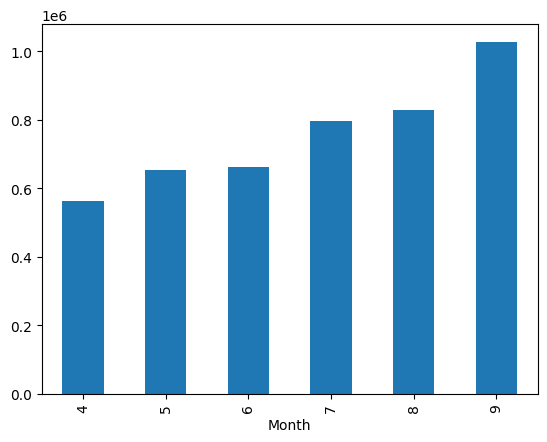

In [ ]:
# Now we will use these features to explore the pickups data per month

# Determine the total number of pickups per month in the 2014 sample and plot it with a bar chart

uber_2014_pickup_data.groupby('Month')['Base'].count().plot(kind='bar')

<Axes: xlabel='Month'>

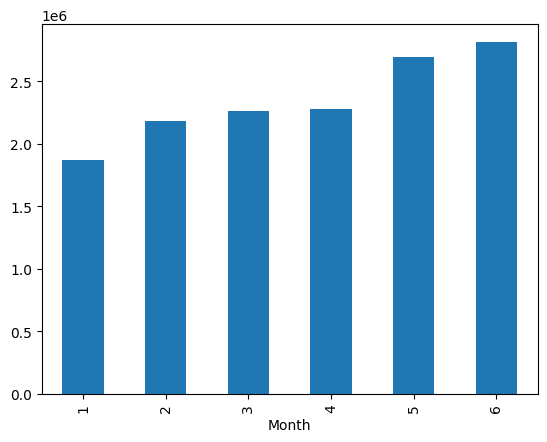

In [ ]:
uber_2015_pickup_data.groupby('Month')['Affiliated_base_num'].count().plot(kind='bar')

---
---
---

- <font color="red">What do we observe?</font>

- What happens month-over-month in 2014 and in 2015?

- How does the total number of trips compare per year?

- How might we explain what we see?

- What might we need to investigate further?

---
---
---

### Rides Per Day

- Which days had more total pickups, and how do the number of pickups compare across days?

- Consider the 2014 and 2015 sample.

<Axes: xlabel='DayOfWeek'>

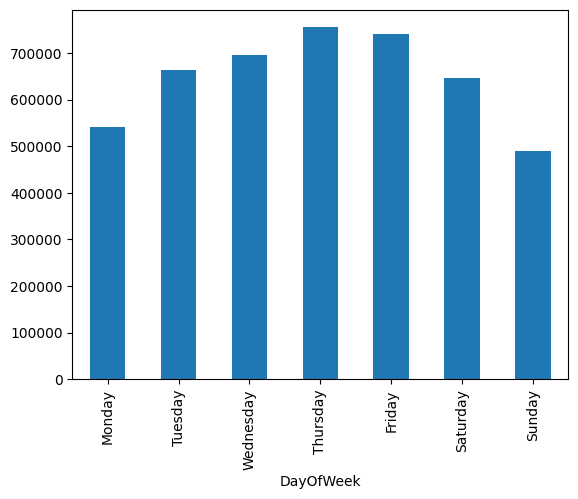

In [ ]:
uber_2014_pickup_data.groupby(['DayOfWeekNum', 'DayOfWeek'])['Base']\
.count()\
.sort_index(level='DayOfWeekNum')\
.droplevel(0, axis=0)\
.plot(kind='bar')

<Axes: xlabel='DayOfWeek'>

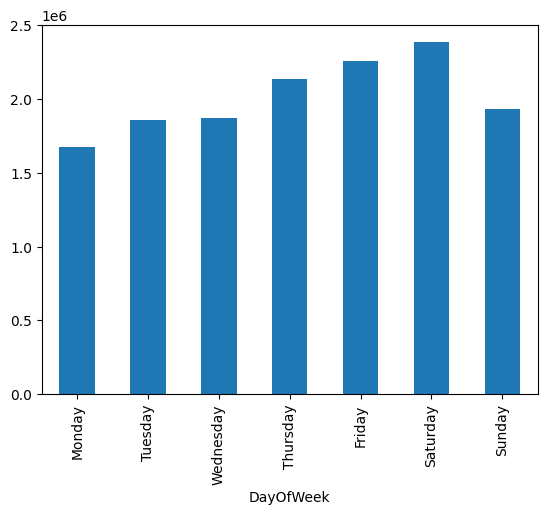

In [ ]:
uber_2015_pickup_data.groupby(['DayOfWeekNum', 'DayOfWeek'])['Affiliated_base_num']\
.count()\
.sort_index(level='DayOfWeekNum')\
.droplevel(0, axis=0)\
.plot(kind='bar')

---
---
---

- <font color="red">What do we observe?</font>

- What happens in 2014 and in 2015?

- How might we explain what we see?

- What might we need to investigate further?

  - Can the month help explain?

---
---
---

### Rides Per Day and Per Month

- Which days per month had more total pickups, and how do the number of pickups compare across days per month?

- Consider the 2014 and 2015 sample.

<Axes: xlabel='DayOfWeek'>

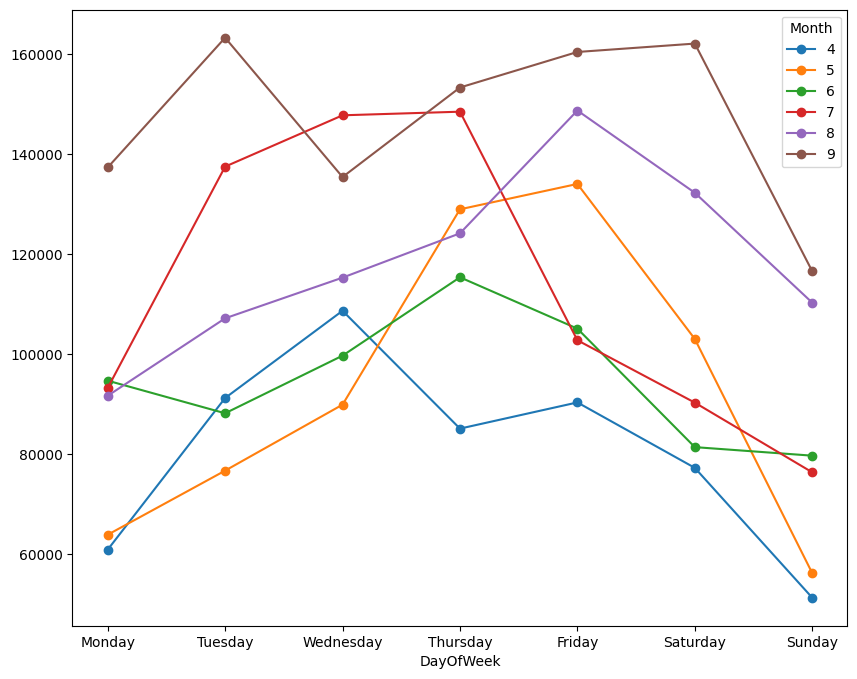

In [ ]:
uber_2014_pickup_data.groupby(['Month', 'DayOfWeekNum', 'DayOfWeek'])['Base']\
.count()\
.unstack(level='Month')\
.sort_index(level='DayOfWeekNum')\
.droplevel(0, axis=0)\
.plot(marker='o', figsize=(10,8))

---
---
---

- We see how the number of pickups is, roughly, increasing over months.

- We also see, per month, that rides tend to peak sometime during the week.

---
---
---

In [ ]:
# df = uber_2014_pickup_data.groupby(['Month', 'DayOfWeekNum', 'DayOfWeek'])['Base']\
# .count()\
# .unstack(level='Month')\
# .sort_index(level='DayOfWeekNum')\
# .droplevel(0, axis=0)

In [ ]:
# fig, axs = plt.subplots(nrows=6, ncols=1, sharex=True, sharey=True, figsize=(10,12))
# axs = axs.flatten()

# for i in range(len(axs)):
#   df.iloc[:, i].plot(marker='o', ax=axs[i], label=f'Month {df.iloc[:, i].name}', legend=True)

# plt.show()

<Axes: xlabel='DayOfWeek'>

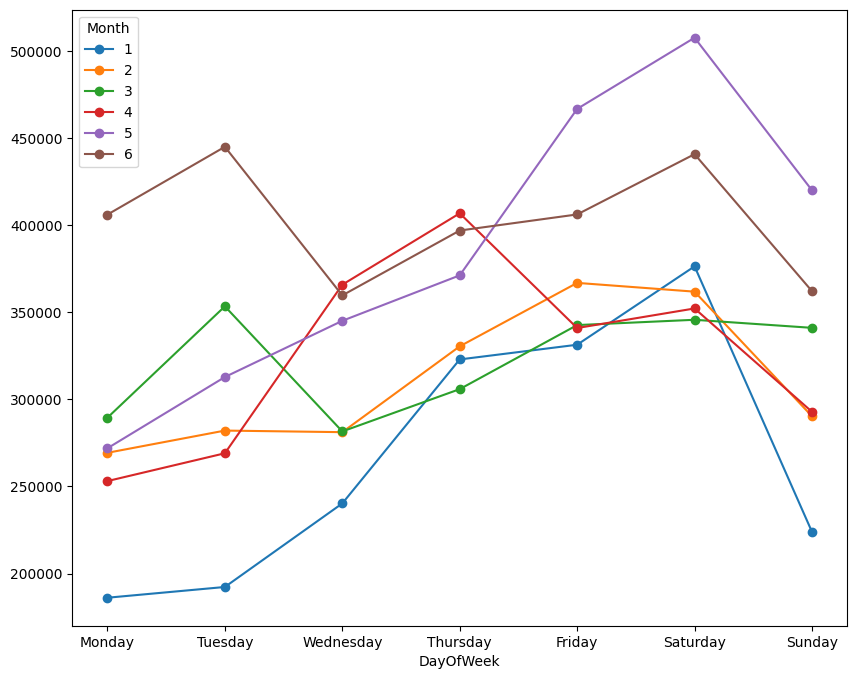

In [ ]:
uber_2015_pickup_data.groupby(['Month', 'DayOfWeekNum', 'DayOfWeek'])['Affiliated_base_num']\
.count()\
.unstack(level='Month')\
.sort_index(level='DayOfWeekNum')\
.droplevel(0, axis=0)\
.plot(marker='o', figsize=(10,8))

---
---
---

- We see how the number of pickups is, roughly, increasing over months, though not as much compared to 2014.

- We also see, per month, that rides tend to peak less during the week, and more on Saturday (especially compared to 2014), with a sharp drop on Sunday (which is something we saw in 2014).

---
---
---

---
---
---

- <font color="red">What else do we observe?</font>

- How might we explain what we see?

- What might we need to investigate further?

---
---
---

### Rides Per Hour

- Which hours per day had more total pickups?

- Consider the 2014 and 2015 sample.

<Axes: xlabel='Hour'>

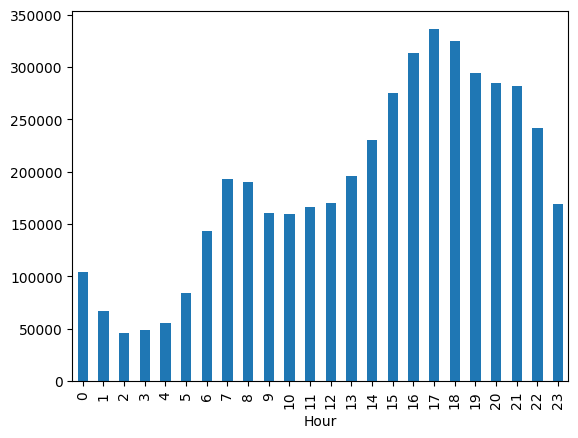

In [ ]:
uber_2014_pickup_data.groupby('Hour')['Base']\
.count()\
.plot(kind='bar')

<Axes: xlabel='Hour'>

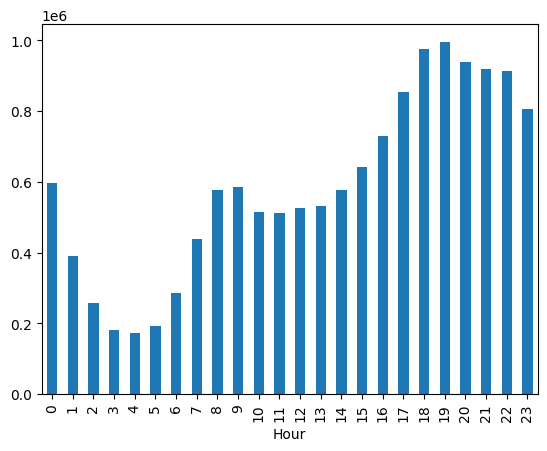

In [ ]:
uber_2015_pickup_data.groupby('Hour')['Affiliated_base_num']\
.count()\
.plot(kind='bar')

---
---
---

- <font color="red">What do we observe?</font>

- What happens in 2014 and in 2015?

- How might we explain what we see?

- What might we need to investigate further?

  - It appears we have a very similar intraday pattern across 2014 and 2015 with peak hours before work, after work, with elevated but decreasing ride levels until late at night.

  - Does this intraday pattern persist across days and months?

---
---
---

### Rides Per Hour, Per Day, and Per Month

- Which hours per day and per month had more total pickups?

  - Note that there are many dimensions from the groups, so how might we best display the data?

  - Based on what graph we want to see, we need to consider what our data frame should look like?

  - Once we know what the data frame should look like, we can begin its construction.

- Consider the 2014 and 2015 sample.

In [ ]:
df = uber_2014_pickup_data.groupby(['Month', 'DayOfWeekNum', 'DayOfWeek', 'Hour'])['Base']\
.count()\
.unstack(level='Month')\
.sort_index(level='DayOfWeekNum')\
.droplevel(0, axis=0)

df

Month              4     5     6     7     8     9
DayOfWeek Hour                                    
Monday    0      518   767   912  1260  1094  1885
          1      261   466   512   613   684  1201
          2      238   304   420   439   560   977
          3      571   627  1049  1019  1186  1780
          4     1021   977  1712  1615  1836  2479
...              ...   ...   ...   ...   ...   ...
Sunday    19    2579  2881  4163  3700  6195  6430
          20    2276  2782  4086  4012  5990  5930
          21    2310  2809  4285  3740  5659  5164
          22    1639  2230  3452  3291  4839  4115
          23    1018  1487  1872  2198  3265  2326

[168 rows x 6 columns]

<Axes: xlabel='Hour'>

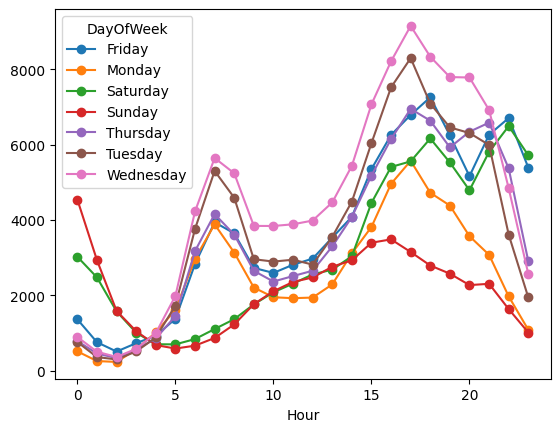

In [ ]:
df.iloc[:, 0].unstack(level='DayOfWeek')\
.plot(marker='o')

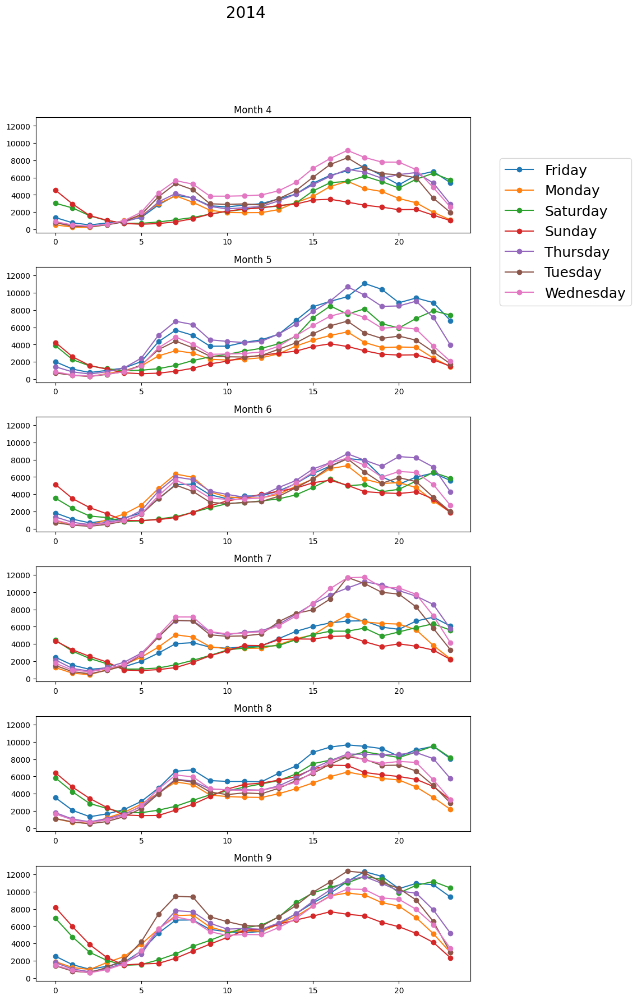

In [ ]:
fig, axs = plt.subplots(nrows=6, ncols=1, sharex=False, sharey=True, figsize=(10,20))
axs = axs.flatten()

for i in range(len(axs)):
  df.iloc[:, i].unstack(level='DayOfWeek').plot(marker='o', ax=axs[i], legend=False)
  axs[i].set_title(f'Month {df.iloc[:, i].name}')
  axs[i].set_xlabel('')


fig.legend(df.iloc[:, 0].unstack(level='DayOfWeek').columns, bbox_to_anchor=(1.2, 0.85), fontsize=18)
plt.suptitle('2014', fontsize=20)
plt.subplots_adjust(hspace=0.3)
plt.show()

In [ ]:
df = uber_2015_pickup_data.groupby(['Month', 'DayOfWeekNum', 'DayOfWeek', 'Hour'])['Affiliated_base_num']\
.count()\
.unstack(level='Month')\
.sort_index(level='DayOfWeekNum')\
.droplevel(0, axis=0)

df

Month               1      2      3      4      5      6
DayOfWeek Hour                                          
Monday    0      4702   8975   7467   6256   9464  12569
          1      2727   4656   4250   3493   5456   7199
          2      1614   2875   2449   1881   3579   4250
          3      1271   2128   1877   1511   2584   3164
          4      2145   2524   3141   2750   3306   5079
...               ...    ...    ...    ...    ...    ...
Sunday    19    12265  16277  18567  15187  23896  17745
          20    10389  14449  17242  14997  22321  16150
          21     9792  13931  15631  13897  21228  18230
          22     9145  17729  14791  13276  20200  19995
          23     7197  12737  11567  10712  17615  18429

[168 rows x 6 columns]

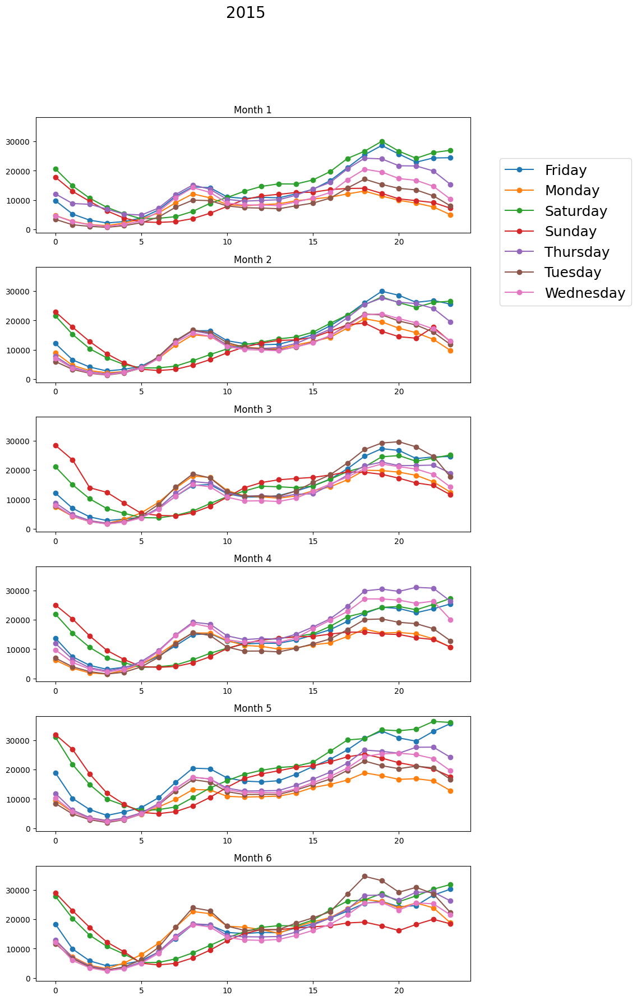

In [ ]:
fig, axs = plt.subplots(nrows=6, ncols=1, sharex=False, sharey=True, figsize=(10,20))
axs = axs.flatten()

for i in range(len(axs)):
  df.iloc[:, i].unstack(level='DayOfWeek').plot(marker='o', ax=axs[i], legend=False)
  axs[i].set_title(f'Month {df.iloc[:, i].name}')
  axs[i].set_xlabel('')


fig.legend(df.iloc[:, 0].unstack(level='DayOfWeek').columns, bbox_to_anchor=(1.2, 0.85), fontsize=18)
plt.subplots_adjust(hspace=0.3)
plt.suptitle('2015', fontsize=20)
plt.show()

---
---
---

- <font color="red">What do we observe?</font>

- What happens in 2014 and in 2015?

- How might we explain what we see?

- What might we need to investigate further?

  - It appears we have a very similar intraday pattern across 2014 and 2015 with peak hours before work, after work, with elevated but decreasing ride levels until late at night.

  - Does this pattern persist across days and months?

    - Yes, it roughly persists, though the ordering of more favorable or less favorable days can slightly change across different months.

    - This anecdotally appears to be a robust pattern, and it can influence how we normalize the data to compare across hours!

    - How might we reduce this to a single graph in a statistically sensible way?

      - Perhaps we can take an average of these curves across months.

      - Are there any risks to taking such an average?

---

- <b>How might these observations impact how we adjust pricing throughout the day and how we might need to adjust hotspot locations, and hence our matching/routing engine, throughout the day?</b>

---
---
---

<Axes: xlabel='Hour'>

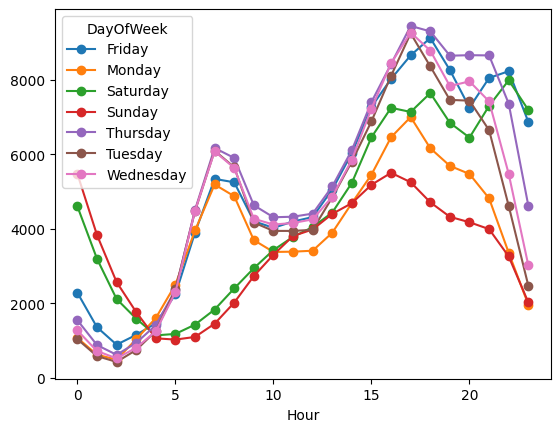

In [ ]:
uber_2014_pickup_data.groupby(['Month', 'DayOfWeekNum', 'DayOfWeek', 'Hour'])['Base']\
.count()\
.unstack(level='Month')\
.sort_index(level='DayOfWeekNum')\
.droplevel(0, axis=0)\
.mean(axis=1)\
.unstack(level='DayOfWeek')\
.plot(marker='o')

<Axes: xlabel='Hour'>

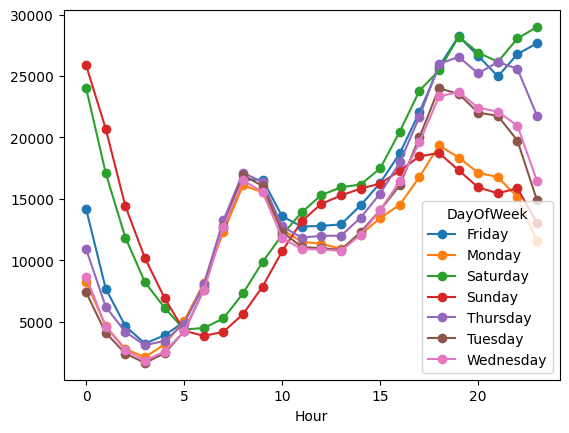

In [ ]:
uber_2015_pickup_data.groupby(['Month', 'DayOfWeekNum', 'DayOfWeek', 'Hour'])['Affiliated_base_num']\
.count()\
.unstack(level='Month')\
.sort_index(level='DayOfWeekNum')\
.droplevel(0, axis=0)\
.mean(axis=1)\
.unstack(level='DayOfWeek')\
.plot(marker='o')

In [ ]:
# base_names = {
#     "Base":
#  {'B02617':'Weiter',
#   'B02598':'Hinter',
#   'B02682':'Schmecken',
#   'B02764':'Danach-NY',
#   'B02512':'Unter'}
#               }

# # We could add this to a dataframe as a new colum: 'BaseName'
# uber_2014_pickup_data[['Base']].replace(base_names)


### Other Considerations Per Group

- We could do univariate and multivariate distributional analysis per group, for all the groups we just formed.

- We can also formalize many of our questions using regressions (more on this later).

- Where could we use <b>prediction</b>, <b>optimization</b>, <b>simulation</b>, or <b>hypothesis testing</b>?

$\rule{800pt}{20pt}$

# <a href="https://en.wikipedia.org/wiki/Cluster_analysis">Algorithmic EDA: Clustering</a>
<br>
<font size="+1">
    <ul>
        <li>Typically, we explore data without a rigid set of rules governing how data is explored.</li>
        <br>
        <li>That is, we informally explore the data looking for patterns or insights, as well as forming hypotheses.</li>
        <br>
        <li>There are formal methodologies, however, for exploring data to extract meaning.</li>
        <br>
        <li><b>Unsupervised learning</b> is an algorithmic or statistical methodology to perform exploratory data analysis, which comes in handy when the data is high-dimensional, or when there isn't obvious groupings for data.</li>
        <br>
        <li>In other words, <b>unsupervised learning</b> $\iff$ <b>algorithmic/statistical EDA</b> (particularly useful when there is a large number of variables).</li>
        <br>
        <li>Unsupervised learning (algorithmic/statistical EDA) can be used to gain insight into a data set, which including discovering how the different variables relate to each other.</li>
        <br>
        <li>Unsupervised techniques allow you to analyze these variables and discover the relationships using algorithmic solutions.</li>
        <br>
        <li>Clustering is one type of an <b>unsupervised</b> machine learning methodology.</li>
        <br>
        <font color="red"><li style="color:red">How would you define what it means to <i>cluster</i> data?</li>
        <br>
        <li style="color:red">Given clustering methods can be used to identify distinct groups of data, what lines of business, products, or services would benefit from clustering data points?</li>
        <br>
        <ul style="color:red">
            <font color="red"><li>Web clicks and demographic data of a user on a website may allow for distinct groupings of users. The website could then be personalized to these different types of users.</li>
            <br>
            <li>groupings of documents, music, and movies by different topics, or finding customers that share similar interests based on common purchase behaviors as a basis for recommendation engines.</li>
            <br>
        </ul>
    </ul>
</font>

$\square$

$\rule{800pt}{20pt}$

## August 2014

---
---

<br>
<font size="+1">
    <ul>
        <li>For now, we will arbitrarily choose to work with data from August 2014, simply to reduce the size of the data.</li>
        <br>
    </ul>
</font>

---
---

In [ ]:
%%time

uber_August_2014_trip_data = pd.read_csv(os.path.join(data_path, 'Uber_Trip_Data_2014', 'uber-raw-data-aug14.csv'))

uber_August_2014_trip_data['Date'] = pd.to_datetime(pd.to_datetime(uber_August_2014_trip_data['Date/Time']).dt.date)

uber_August_2014_trip_data.head()

CPU times: user 5.99 s, sys: 253 ms, total: 6.24 s
Wall time: 8.69 s


,Date/Time,Lat,Lon,Base,Date
0,8/1/2014 0:03:00,40.7366,-73.9906,B02512,2014-08-01
1,8/1/2014 0:09:00,40.7260,-73.9918,B02512,2014-08-01
2,8/1/2014 0:12:00,40.7209,-74.0507,B02512,2014-08-01
3,8/1/2014 0:12:00,40.7387,-73.9856,B02512,2014-08-01
4,8/1/2014 0:12:00,40.7323,-74.0077,B02512,2014-08-01


In [ ]:
uber_August_2014_trip_data.shape

(829275, 5)

In [ ]:
uber_August_2014_trip_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829275 entries, 0 to 829274
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   Date/Time  829275 non-null  object        
 1   Lat        829275 non-null  float64       
 2   Lon        829275 non-null  float64       
 3   Base       829275 non-null  object        
 4   Date       829275 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(2), object(2)
memory usage: 31.6+ MB


$\rule{800pt}{20pt}$

## What Is the Vague Concept of <i>Clustering</i>?
<br>
<font size="+1">
    <ul>
        <li>Clustering doesn't refer to a single well-defined algorithm, but rather a vague idea regarding the methodology of <i>how to separate or group observations from a data set</i>.</li>
        <br>
        <li>Clustering analysis has its academic roots starting in the 1930's in the fields of anthropology and psychology.</li>
        <br>
        <li>Popular notions of clusters include </li>
        <br>
        <ul>
            <li>groups with small distances between cluster members,</li>
            <br>
            <li>dense areas of the data space,</li>
            <br>
            <li>pre-defined intervals,</li>
            <br>
            <li>or particular statistical distributions.</li>
            <br>
        </ul>
        <li>The appropriate clustering algorithm and parameter settings (including parameters such as the distance function to use, a density threshold or the number of expected clusters) depend on the individual data set and the intended use of the results.</li>
        <br>
        <li>In short, there are many different clustering algorithms, and it is hard to determine which one is best to use without a lot of trial and error.</li>
        <br>
        <li>Determining if the cluster is good or not is just as difficult as coming up with algorithms for how to cluster data.</li>
        <br>
        <ul>
            <li>The determination heavily relies on how one plans on using the groupings in your downstream process $\implies$ predictive or prescriptive analytics tasks.</li>
            <br>
            <li>That is, are the groupings to be used directly, analyzed more deeply, passed as a independent or dependent variable in a regression or classification algorithm, etc.</li>
            <br>
        </ul>
    </ul>
</font>

$\square$

## Why Bother?
<br>
<font size="+1">
    <ul>
        <li>One reason is to find a pattern or distinction between homogeneous (similar) groups that otherwise wouldn't be apparent in the full heterogeneous (dissimilar) sample.</li>
        <br>
        <li>This is particularly helpful when the data is high-dimensional or when then interpretability of the variables is low.</li>
        <br>
        <font color="red"><li style="color:red">How might Uber plan on using our clusters?</li>
        <br>
        <ul>
            <font color="red"><li style="color:red">The goal is to apply clustering algorithms to the data set to identify rider pickup hot-spots to better facilitate the matching of riders and drivers.</li>
            <br>
        </ul>
    </ul>
</font>

## Clustering and Sci-Kit Learn
<br>
<font size="+1">
    <ul>
        <li>Python's machine learning package, Scikit learn, <a href="https://scikit-learn.org/stable/modules/classes.html#module-sklearn.cluster">has a module that implements many clustering algorithms</a> for us to use without having to code them from scratch.</li>
        <br>
        <li>Scikit Learn also has great exposition available on their clustering method implementations <a href="https://scikit-learn.org/stable/modules/clustering.html#clustering">here</a>.</li>
        <br>
    </ul>
</font>

- Additional Links

  - [KMeans (scikit-learn)](https://scikit-learn.org/dev/modules/generated/sklearn.cluster.KMeans.html)
  - [DBSCAN (scikit-learn)](https://scikit-learn.org/dev/modules/clustering.html#dbscan)
  - [Hierarchical Clustering (Wikipedia)](https://en.wikipedia.org/wiki/Hierarchical_clustering)
  - [Agglomerative Clustering (scikit-learn)](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html#sklearn.cluster.AgglomerativeClustering)
  - [Ward Clustering: Structured vs Unstructured Example (scikit-learn)](https://scikit-learn.org/dev/auto_examples/cluster/plot_ward_structured_vs_unstructured.html)
  - [Agglomerative Dendrogram Example (scikit-learn)](https://scikit-learn.org/dev/auto_examples/cluster/plot_agglomerative_dendrogram.html)


## K-Means Clustering
<br>
<font size="+1">
    <ul>
        <li><i>K-means</i> was one of the first clustering method to be developed, and it belongs to a category of <i>prototype-based clustering</i>.</li>
        <br>
        <ul>
          <li>Prototype-based clustering means that each cluster is represented by a prototype, which is usually either the <b>centroid</b> (average) of similar points with continuous features, or the <b>medoid</b> (the most representative or the point that minimizes the distance to all other points that belong to a particular cluster) in the case of categorical features.</li>
          <br>
          <li>Other categories are hierarchical-based clustering and density-based clustering.</li>
          <br>
        </ul>
        <li>It is a relatively simple algorithm and can scale to large data sets, which partly explains its popularity.</li>
        <br>
        <li>While K-means is very good at identifying clusters with a <i>spherical shape</i>, one of the drawbacks of this algorithm is that we have to specify the number of clusters $K$ before we start to group the data.</li>
        <br>
        <li>A poor choice for $K$ can result in poor clustering performance.</li>
        <br>
    </ul>
</font>
<br>
<img src="https://miro.medium.com/max/748/0*AYHo5J8MUmngdjxa">
<br>
<br>
<img src="https://miro.medium.com/max/1200/1*rw8IUza1dbffBhiA4i0GNQ.png" width=500 height=500>
<br>
<br>
<img src="https://i0.wp.com/thaddeus-segura.com/wp-content/uploads/2020/08/3d-k-meanas.jpeg?fit=261%2C193&ssl=1" height=500 width=500>
<br>
<br>

$\square$

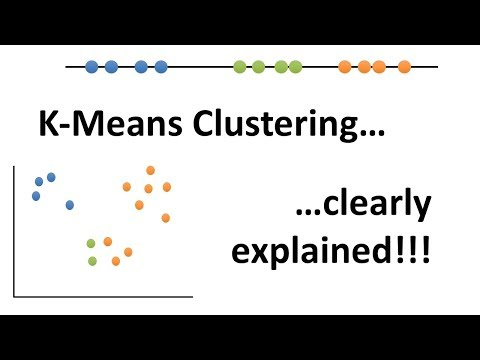

In [ ]:
# Video by StatsQuest
from IPython.display import YouTubeVideo

YouTubeVideo('4b5d3muPQmA', width=800, height=300)

### Terminology of K-Means Clustering
<br>
<font size="+1">
    <ul>
        <li>Common terminology in <i>K-Means clustering</i> include</li>
        <br>
        <ul>
            <li><i>cluster</i> = a group of observations that are similar</li>
            <br>
            <li><i>cluster mean</i> = a vector (list) of means for the observations in a particular cluster</li>
            <br>
            <li><i>K</i> = the number of clusters</li>
            <br>
        </ul>
        <li>At a high level, the K-means clustering algorithm forms groups by</li>
        <br>
        <ul>
            <li>minimizing the sum of the squared distances between each obsevation and the <i>mean</i> of its assigned cluster (referred to as the <i>within-cluster sum of squares</i> or <i>within-cluster SS</i>)</li>
            <br>
            <li>We can formalize this <i>within-cluster sum of squares</i> notion as follows: $$SS = \sum_{i=1}^n \sum_{k=1}^K ||X_i - \mu_j||_2^2 \ \mathbb{1}_{\{x_i \in Cluster_j\}},$$ where we define the $L_2$-norm as the Euclidean distance between two vectors $$||x - y||_2^2 = d(x,y)^2 = \sum_{j=1}^p (x_j - y_j)^2.$$</li>
            <br>
        </ul>
        <li>K-means does not guarantee the clusters will be of similar sizes, but rather finds clusters that are <i>best separated</i>.</li>
        <br>
        <li>The idea behind K-means clustering is that a <i>good</i> clustering is one for which the <i>within-cluster variation</i> is as small as possible.</li>
        <br>
    </ul>
</font>

$\square$

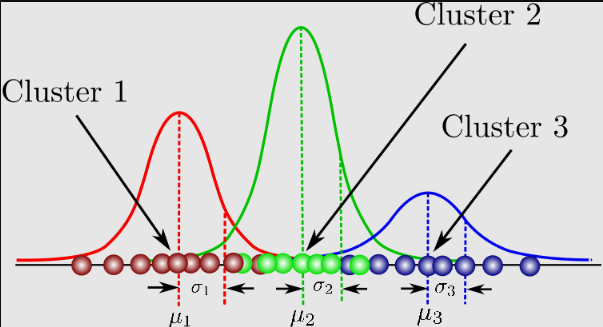

In [ ]:
tf.keras.preprocessing.image.load_img(os.path.join(images_path, 'mixture_models_I.png'))

### A Little Theory: Modeling Data as Mixture Models
<br>

---
---

- Clustering works by representing data as the output of a <b>mixture model</b>.

- In a mixture model, you assume each observation of the vector of features $X_i \in \mathbb{R}^p$ is sampled from one of $K$ different mixture components (probability distributions) $p_k(x)$, for $k \in \{1, \cdots, K\}$.

  - The parameters of these distributions, particularly their means define the clusters.

- We say the data <b>clusters</b> are those observations that we estimate have been drawn from each underlying component (probability distribution).

  - Note that even if the probability distributions are well defined, there will be ambiguity about the clusters, particularly in the regions where tails overlap $\implies$ it is not possible to determine exactly which distribution generated each observation.

  - Each observation typically gets assigned to the probability distribution with the highest probability of having generated that data point.

- The mixture probability distribution can be represented as follows:
$$
p(x) = \pi_1 p_1(x) + \dots + \pi_K p_K(x),
$$
where $\pi_i$ represents the probability of distribution $p_i$ representing the population.

- When you observe your data, you only get to observe the mixture distribution $p(x)$, and you <b>do not</b> observe the underlying mixture components, which implies you don't know the clusters $\implies$ which observations have been allocated to each component?

  - This is why we say the mixture components are <b>latent</b>.

  - The mixture components generate your data, but we don't get to observe how the data generation occurred.

  - <b>How do we estimate these latent distributions?</b>

---
---

- To fit the mixture component distributions, we will:

  - specify a model, and

  - fit the parameters of this model to minimize <i>deviations</i> (we need to formalize what this means later).

- For example, each component distribution has a mean $\mu_i = \mathbb{E}[X_i | k_i]$ that represents the expected value for an observation $X_i$ given that observation belongs to cluster $k \in \{1, \dots, K\}$.

  - In other words, these are conditional expectations given cluster membership.

---
---

- We can specify a model by assuming multivariate Gaussian distributions for each probability distribution component,
$$
p_k(x) = \mathcal{N}(x; \underbrace{\mu_k}_{\text{mean} \\ \text{vector}}, \underbrace{\Sigma_k}_{\text{covariance} \\ \text{matrix}}).
$$

- Such a model is known as a <b>Gaussian mixture model</b>.

---
---

- We will then need to estimate the Gaussian mixture model's set of parameters, which leads to our first algorithm $\implies$ <b>K-Means clustering</b>.

---
---

- Mixture modeling is a rich topic and there are many more sophisticated algorithms for fitting mixtures. For more, see <a href="https://en.wikipedia.org/wiki/Mixture_model">here</a>.

---
---

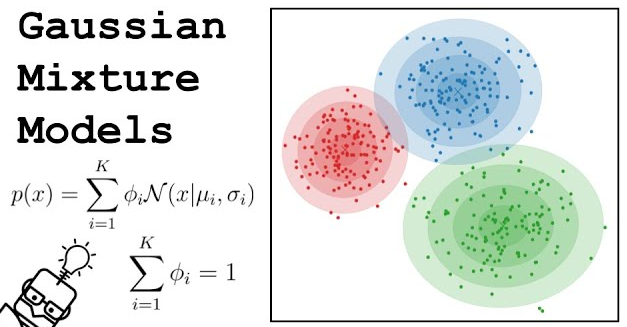

In [ ]:
tf.keras.preprocessing.image.load_img(os.path.join(images_path, 'mixture_models_II.png'))

### K-Means Clustering as an Algorithm for Estimating Mixture Means
<br>

- K-means is the most common algorithm that is used for <b>clustering</b> $\iff$ <b>estimating the latent mixture component centers $\mu_k$ and allocating each observation to its highest probability component</b>.

  - It is an <i>iterative least squares</i> algorithm, it iterates between:

    - first choosing the mixture component membership for each observation $X_i$,
    
    - then using the mean of the observations allocated to each component to estimate its mean $\mu_k$.

  - The <i>least squares</i> component of the algorithm is where it chooses each observation's cluster membership $k_i$ by minimizing the squared distance between the observation $X_i$, and its assigned component mean.

- After you run the K-means algorithm, you will have a set of <b>cluster centers / centroids</b> that are estimates of the component means $\widehat{\mu}_k$, and a cluster membership label $k_i$ for each observation $X_i$.

---
---

- The K-means algorithm can be though of as estimating a Gaussian mixture model with components
$$
p_k(x) = \mathcal{N}(x; \underbrace{\mu_k}_{\text{mean} \\ \text{vector}}, \underbrace{\Sigma_k}_{\text{covariance} \\ \text{matrix}}),
$$
but where the $\Sigma_k$ covariance matrices are resticted to take the form
$$
\Sigma_k =
\begin{bmatrix}
\sigma_{k}^2 & 0 & 0 & \cdots & 0 \\
0 & \sigma_{k}^2 & 0 & \cdots & 0 \\
0 & 0 & \sigma_{k}^2 & \cdots & 0 \\
\vdots & \vdots & \vdots & \ddots & \vdots \\
0 & 0 & 0 & \cdots & \sigma_{k}^2
\end{bmatrix}.
$$

  - This implies all the covariates have equal variance $\sigma_k^2$ and are all independent from each other (which seems like an unreasonable assumption for many practical cases).

  - This independence assumption, while being unrealistic, makes it much easier to fit a mixture model and this convenience is a big part of the popularity of K-means.

  - <font color="red">For those that know what maximum likelihood estimation is, stay tuned, otherwise you may ignore.</font>

    - The assumption of independence allows us to write the conditional likelihood for an observation given its cluster membership $k_i$ as a product of univariate Gaussian distributions $$p(x_i | k_i) = p_{k_i}(x_i) = \prod_{j=1}^p \mathcal{N}(x_{i,j}; \mu_{k_i, j}, \sigma_k^2)$$

    - This maximum likelihood implies the least-squares minimization objective function.

      -  Gaussian likelihood implies least squares minimization because maximizing the likelihood is the same as minimizing the sum of squared deviations when the errors are normally distributed.
      
      - For more, see <a href="https://stats.stackexchange.com/questions/12562/equivalence-between-least-squares-and-mle-in-gaussian-model">here</a>.

---
---

- The assumption of a single shared variance for each component distribution $\sigma_k^2$ for all dimensions of each observation $X_i$ is also restrictive.

- However, you can mitigate issues coming from this assumption by making sure to transform all dimensions of $X$ to have the same variance before running K-means.

- This leads us to standardizing the data, and transforming the data into units of <i>standard deviations from the pooled average</i>.

---
---

### Normalization
<br>
<font size="+1">
    <ul style="color:blue">
        <font color="blue"><li>This is an important and often overlooked step in algorithm design.</li>
        <br>
        <li>Let’s look at similarity between observations with and without normalization.</li>
        <br>
        <li>In the following figure, you find that red appears to be more similar to blue than yellow.</li>
        <br>
        <li>However, the variables on the x- and y-axes do not have the same <b>scale</b>.</li>
        <br>
        <ul>
            <li>Recall, in statistics the <b>scale</b> generally refers to the <b>standard deviation</b> of a variable.</li>
            <br>
            <li>Some algorithms may depend, either explicitly or implicitly, on the standard deviation (scale) of covariates.</li>
            <br>
            <li>Often times, in algorithms with parameters that depend on the standard deviation of the covariates, the result of the algorithm will be highly <b>biased</b> by the scale.</li>
            <br>
            <li>However, <b>bias</b> isn't always a bad thing! In this event, it is advised you do further experimentation when deciding if you should scale the covariates before using them in your algorithm.</li>
            <br>
            <li><i>It is commonly difficult to make this determination without experimentation (this is a common theme in analytics)!</i></li>
            <br>
        </ul>
        <li><b>Therefore, the observed similarity might be an artifact of unscaled data.</b></li>
        <br>
        <li>After <i>Z-score</i> normalization, all the variables have the same scale.</li>
        <br>
        <li>Now, you find that red is actually more similar to yellow.</li>
        <br>
        <li>Thus, after normalizing data, you can calculate similarity more accurately.</li>
        <br>
        <li><img src="https://developers.google.com/machine-learning/clustering/images/NormalizeData.png"></li>
        <br>
        <li><a href="https://datascience.stackexchange.com/questions/6715/is-it-necessary-to-standardize-your-data-before-clustering">Interesting commentary on normalization of covariates.</a></li>
        <br>
        <ul>
            <li>As well as <a href="https://stats.stackexchange.com/questions/244507/what-algorithms-need-feature-scaling-beside-from-svm">here</a>, <a href="https://stats.stackexchange.com/questions/41704/how-and-why-do-normalization-and-feature-scaling-work">here</a>, and <a href="https://stats.stackexchange.com/questions/19216/variables-are-often-adjusted-e-g-standardised-before-making-a-model-when-is">here</a>.</li>
            <br>
        </ul>
    </ul>
</font>

In [ ]:
####################################################
## Normalization of our covariates
####################################################

uber_August_2014_trip_data.head()

,Date/Time,Lat,Lon,Base,Date
0,8/1/2014 0:03:00,40.7366,-73.9906,B02512,2014-08-01
1,8/1/2014 0:09:00,40.7260,-73.9918,B02512,2014-08-01
2,8/1/2014 0:12:00,40.7209,-74.0507,B02512,2014-08-01
3,8/1/2014 0:12:00,40.7387,-73.9856,B02512,2014-08-01
4,8/1/2014 0:12:00,40.7323,-74.0077,B02512,2014-08-01


In [ ]:
# Select the covariates we want to perform the clustering on
uber_August_2014_trip_data_covariates = uber_August_2014_trip_data[['Lat', 'Lon']]

uber_August_2014_trip_data_covariates.head()

,Lat,Lon
0,40.7366,-73.9906
1,40.7260,-73.9918
2,40.7209,-74.0507
3,40.7387,-73.9856
4,40.7323,-74.0077


In [ ]:
uber_August_2014_trip_data_covariates_normalized = \
(uber_August_2014_trip_data_covariates - uber_August_2014_trip_data_covariates.mean())\
/ (uber_August_2014_trip_data_covariates.std())

uber_August_2014_trip_data_covariates_normalized.head()

,Lat,Lon
0,-0.027064,-0.332446
1,-0.270027,-0.351964
2,-0.386924,-1.309956
3,0.021070,-0.251122
4,-0.125624,-0.610573


In [ ]:
uber_August_2014_trip_data_covariates_normalized.std()

,0
Lat,1.0
Lon,1.0


---
---

- <font color="blue">Alternatively, you can use Scikit-learn's <a href="https://scikit-learn.org/dev/modules/generated/sklearn.preprocessing.StandardScaler.html">Standard Scaler</a> preprocessor class.</font>

---
---

### Algorithm
<br>
<font size="+1">
    <ol style="color:purple">
        <li>Assume we have $n$ observations that are defined by two covariates, say latitude and longitude.</li>
        <br>
        <ul>
            <li>For the $i^{th}$ observation, we observe the variables
                $$(X_{i,1}, X_{i,2}) = (lat_i, lon_i)$$</li>
            <br>
        </ul>
        <li>We want to <i>algorithmically</i> define $K$ clusters of the hotspot pickup locations from the Uber platform.</li>
        <br>
        <ul>
            <li>This means assigning each observation, $(lat_i, lon_i)$, to a cluster $k$.</li>
            <br>
            <li>Once we can assign $n_k$-many observations to cluster $k$, the center is defined to be the average value of the observations in the cluster.</li>
            <br>
            <li>That is
$$
(\bar{X_1}^k, \bar{X_2}^k), \quad \forall 1 \leq k \leq K,
$$
where
$$
\bar{X_1}^k = \frac{1}{n_k}\sum_{i \in Cluster_k} X_{i,1},
$$
and
$$
\bar{X_2}^k = \frac{1}{n_k}\sum_{i \in Cluster_k} X_{i,2}.
$$</li>
            <br>
    <li><font color="red">Note that a set of cluster means must be randomly initialized by randomly assigning each observation to a cluster and then taking the sample mean, since we do not have any ground-truth category information.</font></li>
    <br>
        </ul>
        <li>For a given cluster $k$, we compute a measure of the cluster's <i>size</i> by the sum of squares
        $$
            SS_k = \sum_{i \in Cluster_k} \left[(X_{i,1}- \bar{X_1}^k)^2 + (X_{i,2} - \bar{X_2}^k)^2 \right].
        $$</li>
        <br>
        <li>The K-means clustering algorithm then finds a particular grouping of the observations by minimizing the combined sizes of each cluster, that is
$$
\min \sum_{k=1}^K SS_k.
$$</li>
        <br>
        <ul>
          <li>Note that this within-cluster sum of squared errors is sometimes called the <b>cluster inertia</b>.</li>
          <br>
        </ul>
    </ol>
    <br>
    <br>
$\rule{800pt}{10pt}$    
    <br>
    <ul>
        <li>The K-means clustering algorithm uses randomized starting points to perform the optimization, therefore the results may differ between subsequent runs and different implementations of the method.</li>
        <br>
        <ul>
            <li>It is a good idea to check the fluctuations aren't too great.</li>
            <br>
        </ul>
    <li>The <i>exact</i> solution to the K-means algorithm is computationally very intensive, so heuristic algorithms provide an efficient way to compute a locally optimally solution.</li>
    <br>
    <li>The algorithm goes as follows:</li>
    <br>
    <ol>
        <li>Start with a user-specified $K$ number of clusters and randomly assign observations to clusters in order to compute an initial set of cluster means.</li>
        <br>
        <li>Next, assign each observation to the nearest cluster mean; nearest is measured by squared distance.</li>
        <br>
        <li>Then, compute the new cluster means based on the assignment of observations.</li>
        <br>
        <li>Finally, repeat the previous two steps until the assignment of observations doesn't change; that is, the clusters reach a steady state.</li>
        <br>
    </ol>
    <li>This algorithm isn't guaranteed to find the best possible solution and so it is recommended to run the algorithm several times using different random samples to initialize the algorithm.</li>
    <br>
    <li>When more than one set of iterations is used, the K-means clustering result is selected by choosing the iteration with the lowest within-cluster variation (sum of squares).</li>
    <br>
        <li><a href="https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html">Scikit learn's K-Means clustering implementation.</a></li>
        <br>
    </ul>
    <br>
$\rule{800pt}{10pt}$    
    <br>
    <li>More precisely, to cluster observations $\{X_i\}_{i=1}^n$ into $K$ groups, we need to initialize labels by randomly drawing $k_i \in \{1, \dots, K\}$ for each observation $i$.</li>
    <br>
    <li>First, estimate $$\widehat{\mu}_k = \bar{X}_k = \frac{1}{n_k}\sum_{i : k_i = k} X_i, $$ where $\{i : k_i = k\}$ represents the set of $n_k$ observations that have a cluster label $k_i = k$.</li>
    <br>
    <li>Then, for each observation $i$, update their cluster label $k_i$ to the component with center $\widehat{\mu}_k$ closest to $X_i$, by minimizing the sum of squared distances $$k_i = \arg\min_k \sum_{j} (X_{i,j} - \widehat{\mu}_{k, j})^2.$$</li>
    <br>
</font>
<br>
$\rule{800pt}{10pt}$    
<br>
    <br>
    <font color="red"><li>K-means is a <b>nonconvex</b> distance minimization algorithm.</li>
    <br>
    <li>Nonconvexity says that the error surface isn't a simple cup (e.g. like $x^2$) that has one single minimum $\implies$ it is a lumpy and rough surface that can have multiple solutions that the cluster labels $k_i$  can converge to.</li>
    <br>
    <li>This is why it is recommended that you run K-means multiple times from different random starts and use the solution that gives the lowest sum of squared errors from the centroids $\widehat{\mu}_k$.</li>
    <br>
</font>
<br>
$\rule{800pt}{10pt}$    
<br>
<br>
<img src="https://files.realpython.com/media/kmeans-algorithm.a94498a7ecd2.png">
<br>
<br>

---
---

<br>
<font size="+1">
    <ul>
        <li><font color="blue">The resulting grouping from the above algorithm is what we will interpret as the hotspots for Uber pickups in NYC in August of 2014.</font></li>
        <br>
    </ul>
</font>

---
---

$\square$

In [ ]:
# Import the KMeans algorithm from sklearn.cluster
from sklearn.cluster import KMeans

In [ ]:
# Instantiate the algorithm with the correct set of hyperparameters (choices that govern the structure of the algorithm)

k_means = KMeans(n_clusters=4, # the desired number of groups
               init='k-means++', # method for initialization
               n_init=10, # number of times the algorithm is repeatedly run
               max_iter=300, # maximum number of iterations for a given initialization
               tol=1e-4, # within-cluster SS that has to be achieved to stop the algorithm
               verbose=0,
               random_state=42, # random number generation for centroid initialization
               copy_x=True,
               algorithm='elkan') # the EM-style algorithm used to do estimation in the algorithm

k_means

KMeans(algorithm='elkan', n_clusters=4, n_init=10, random_state=42)

---
---

- We set

  - the number of desired clusters to 4

  - the number of initializations to be 10, which means we run the K-means clustering algorithm 10 times independently with different random centroids to choose the final model as the one with the lowest within-cluster sum of squared distances

  - the maximum number of iterations to be 300, which specifies the maximum number of single runs of the algorithm

    - note that the K-means implementation in scikit-learn stops early if it converges before the maximum number of iterations is reached

    - this convergence is controlled by the tolerance parameter, where tolerance refers to the changes in the within-cluster sum of squares

---
---

#### An Aside: <a href="https://theory.stanford.edu/~sergei/papers/kMeansPP-soda.pdf">K-means++ For Initial Centroid Placement</a>


- The classical K-means algorithm, which uses a random seed to place the initial centroids, can sometimes result in bad clusterings or slow convergence if the initial centroids are chosen poorly.

- One way to address this issue is to run the K-means algorithm multiple times on a data set and choose the best-performing model in terms of the SSE.

---
---

- Another strategy is to <b>place the initial centroids far away from each other</b> via the K-means++ algorithm, which can lead to better and more consistent results compared to the classical K-means.

- The initialization in K-means++ can be summarized as follows:

  1. Initialize an empty set $M$ to store the $K$-centroids being selected.

  2. Randomly choose the first centroid $\mu_j$ from the observations and assign it to $M$.

  3. For each observation $X_i$ that is not in $M$, find the minimum squared distance $d(X_i, M)^2$ to any of the centroids in $M$.

  4. To randomly select the next centroid $\mu_{j+1}$, use a weighted probability distribution equal to $\frac{d(\mu_{j+1}, M)^2}{\sum_i d(X_i, M)^2}$.

    - For example, we collect all points in an array and choose a weighted random sampling, such that the larger the squared distance, the more likely a point gets chosen as the centroid.

  5. Repeat steps 3 and 4 until $K$ centroids are chosen.

  6. Proceed with the classical K-means algorithm.

---
---

  

In [ ]:
%%time

## To run the algorithm, call .fit(data) on the instantiated algorithm

# k_means.fit(uber_August_2014_trip_data_covariates_normalized)
k_means.fit(uber_August_2014_trip_data_covariates)

CPU times: user 8.14 s, sys: 1.62 s, total: 9.76 s
Wall time: 10.5 s


KMeans(algorithm='elkan', n_clusters=4, n_init=10, random_state=42)

In [ ]:
## To access the cluster labels for each observation in the sample, call the instantiated algorithm and apply the attribute .labels_

k_means.labels_

array([1, 3, 3, ..., 1, 1, 3], dtype=int32)

In [ ]:
## Check how many unique cluster labels are in the sample

np.unique(k_means.labels_)

array([0, 1, 2, 3], dtype=int32)

In [ ]:
## Merge the clusters with the original dataset

uber_August_2014_trip_data['Cluster'] = k_means.labels_

uber_August_2014_trip_data.head()

,Date/Time,Lat,Lon,Base,Date,Cluster
0,8/1/2014 0:03:00,40.7366,-73.9906,B02512,2014-08-01,1
1,8/1/2014 0:09:00,40.7260,-73.9918,B02512,2014-08-01,3
2,8/1/2014 0:12:00,40.7209,-74.0507,B02512,2014-08-01,3
3,8/1/2014 0:12:00,40.7387,-73.9856,B02512,2014-08-01,1
4,8/1/2014 0:12:00,40.7323,-74.0077,B02512,2014-08-01,3


---
---

- That's it, the algorithm has run!

- Of course, we still don't know what the optimal number of clusters should be, and we don't know how to evaluate the quality of our clusters.

---
---

### Selecting the Number of Clusters
<br>
<font size="+1">
    <ul>
        <li>The K-means clustering algorithm requires the user to specify the number of clusters $K$ to form <b>before</b> running the algorithm.</li>
        <br>
        <li>Sometimes, the number of clusters is driven by the application.</li>
        <br>
        <ul>
            <li>For example, a company managing a sales team might want to cluster customers into <i>personas</i> to focus and guide sales calls. In this example, managerial considerations would dictate the number of desired customer segments. Two segments might not yield useful differentiation, but ten segments might be too many segments to manage.</li>
            <br>
            <li><font color="blue">In Uber's case, the marketplace designers have to decide how to deal with hotspots. Too many hotspots might create unintended consequences on how drivers are dispatched to riders; too few hotspots might increase wait times because drivers are positioned suboptimally and taking rides too far away from their local hotspot.</font></li>
            <br>
        </ul>
        <li>In the absense of a cluster number prescribed by business related objectives, a statistical approach can be used to choose an optimal $K^*$.</li>
        <br>
        <ul>
          <li>One of the main challenges of unsupervised learning is that we don't know the ground-truth, and so it is hard to obtain a definitive answer to many questions.</li>
          <br>
          <li><font color="red"><b>To quantify the quality of clustering, we need to use intrinsic metrics, such as the within-cluster sum of squares, to compare the performance of different K-means clustering models.</b></font></li>
          <br>
          <li>Lucky for us, we don't have to compute the within-cluster sum of squares explicitly (<i>though you should be able to</i>), as scikit-learn gives us an attribute (<b><i>.inertia_</i></b>) for its computation.</li>
          <br>
        </ul>
        <li>While there is no single standard method to find the optimal number of clusters $K^*$, a common approach is called the <i><b>elbow method</b>.</i></li>
        <br>
        <ul>
            <li>The elbow method is used to identify the set of clusters that explains most of the variance in the data.</li>
            <br>
            <li>Another way of saying this is the elbow method wants to find clusters that produce minimum within-cluster variation.</li>
            <br>
            <li>The <i>elbow</i> is the point where the within-cluster variation flattens out after the steepness slows down.</li>
            <br>
            <li>One then sets the number of clusters to the point where the within-cluster variation flattens, that is, $$\text{elbow} := K^*$$.</li>
            <br>
        </ul>
    </ul>
</font>

$\square$

In [ ]:
# Within-cluster sum of squares for our fitted K-means algorithm
k_means.inertia_

1937.5087853431182

In [ ]:
%%time

# How to choose K^*?

# inertia_ = Sum of squared distances of samples to their closest cluster center, weighted by the sample weights if provided.

# STEP 1: Create an empty dataframe to store the inertias (within-cluster SS) per number of clusters

# STEP 2: Loop through each number of clusters and instantiate the K-means algorithm

# STEP 3: Run the K-means estimation algorithm by calling .fit(data)

# STEP 4: Store the K, inertia value in the dataframe

## Note, sometimes people divide the inertia by the number of clusters to get the average cluster's sum of squares (especially if clusters vary a lot by size)
## When in doubt, and you get a curve that isn't clear, try dividing the inertia by the number of clusters

K_hyperparameters = range(2,8)

inertia = pd.DataFrame(columns=['Inertia', 'Average Cluster Inertia'])
# inertia = []

for num_clusters in K_hyperparameters:
    # k_means_tuning = KMeans(n_clusters=num_clusters)
    k_means_tuning = KMeans(n_clusters=num_clusters, # the desired number of groups
                            init='k-means++', # method for initialization
                            n_init=10, # number of times the algorithm is repeatedly run
                            max_iter=300, # maximum number of iterations for a given initialization
                            tol=1e-4, # within-cluster SS that has to be achieved to stop the algorithm
                            verbose=0,
                            random_state=42, # random number generation for centroid initialization
                            copy_x=True,
                            algorithm='elkan') # the EM-style algorithm used to do estimation in the algorithm

    k_means_tuning.fit(uber_August_2014_trip_data_covariates)
    inertia.loc[num_clusters, 'Inertia'] = k_means_tuning.inertia_
    inertia.loc[num_clusters, 'Average Cluster Inertia'] = k_means_tuning.inertia_ / num_clusters
    # inertia.append(k_means_tuning.inertia_) #/ num_clusters)

CPU times: user 54.6 s, sys: 10.1 s, total: 1min 4s
Wall time: 56 s


In [ ]:
inertia

,Inertia,Average Cluster Inertia
2,2945.347874,1472.673937
3,2338.090099,779.363366
4,1937.508785,484.377196
5,1554.500082,310.900016
6,1301.343844,216.890641
7,1072.931395,153.275914


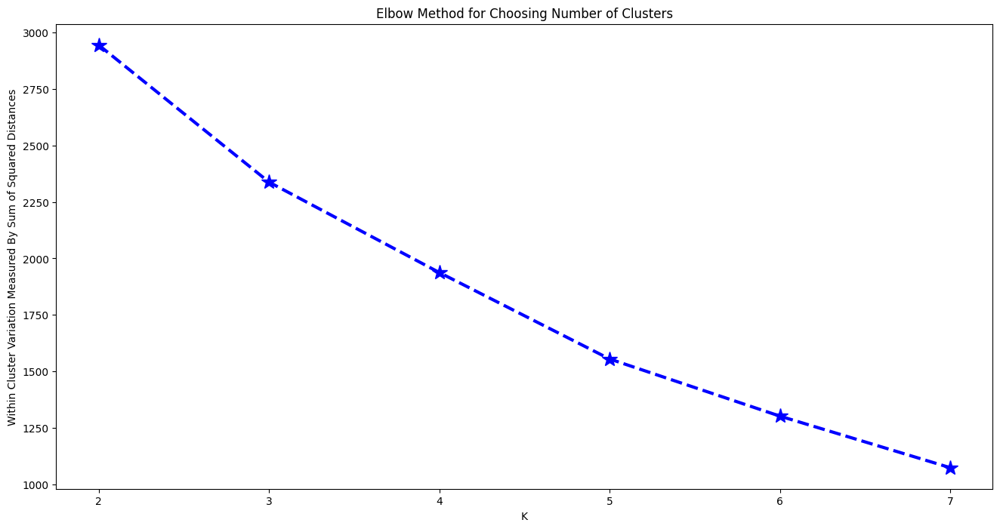

In [ ]:
# Creating Elbow graph for finding the optimal number of clusters K

inertia['Inertia'].plot(figsize=(16,8), marker='*', markersize=15, linewidth=3, color='blue', linestyle='--')

plt.xlabel('K')
plt.ylabel('Within Cluster Variation Measured By Sum of Squared Distances')
plt.title('Elbow Method for Choosing Number of Clusters')

plt.show()

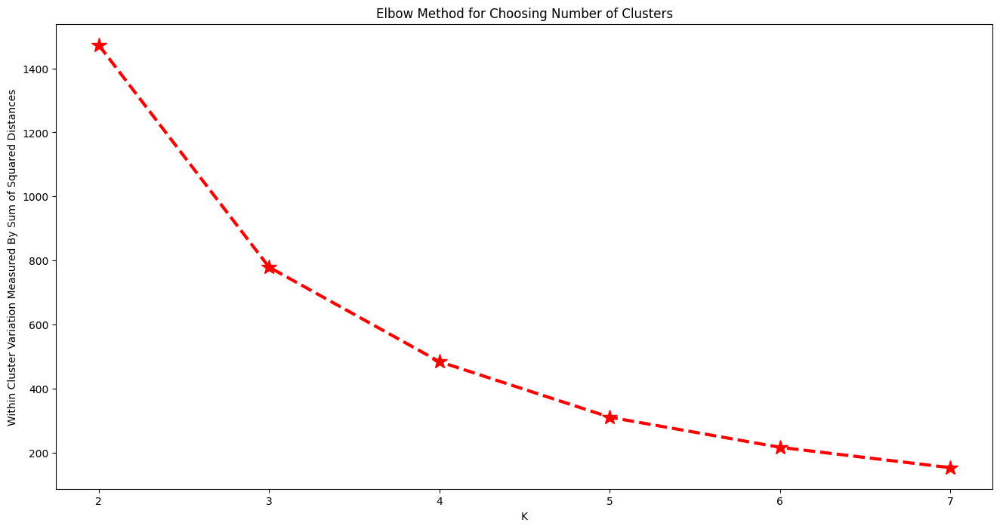

In [ ]:
# Creating Elbow graph for finding the optimal number of clusters K

inertia['Average Cluster Inertia'].plot(figsize=(16,8), marker='*', markersize=15, linewidth=3, color='red', linestyle='--')

plt.xlabel('K')
plt.ylabel('Within Cluster Variation Measured By Sum of Squared Distances')
plt.title('Elbow Method for Choosing Number of Clusters')

plt.show()

In [ ]:
# # Creating Elbow graph for finding the optimal number of clusters K
# plt.figure(figsize=(16,8))

# plt.plot(K_hyperparameters, inertia,
#          marker='*',
#          markersize=15,
#          linewidth=3,
#          color="blue",
#          linestyle='--')

# plt.xlabel('K')
# plt.ylabel('Within Cluster Variation Measured By Sum of Squared Distances')
# plt.title('Elbow Method for Choosing Number of Clusters')

# plt.show()

In [ ]:
# # Creating Elbow graph using cumulative inertia for finding the optimal number of clusters K
# plt.figure(figsize=(16,8))

# plt.plot(K_hyperparameters, np.cumsum(inertia),
#          marker='*',
#          markersize=15,
#          linewidth=3,
#          color="green",
#          linestyle='--')

# plt.xlabel('K')
# plt.ylabel('Variation Explained As Measured By Sum of Squared Distances')
# plt.title('Elbow Method for Choosing Number of Clusters Using Cumulative Explained Variation')

# plt.show()

---
---

<br>
<font size="+1">
    <ul>
        <font color="red"><li style="color:red">Where is the elbow in the above example?</li></font>
        <br>
        <li>There is no obvious candidate since the incremental decrease in within-cluster variation drops gradually.</li>
        <br>
        <ul>
            <li>This is common in data that does not have well-defined clusters.</li>
            <br>
            <li>This is one drawback of the elbow method, however we do gain some insight into the structure of the data.</li>
            <br>
            <li>It could also mean we need a more sophisticated clustering method.</li>
            <br>
            <font color="blue"><li style="color:blue">In general, there is no single rule that will reliably guide how many clusters to produce. Trial, error, and good statistical judgement are what is needed.</li></font>
            <br>
        </ul>
        <li>The following is what a clear elbow could look like.</li>
        <br>
    </ul>
</font>

---
---

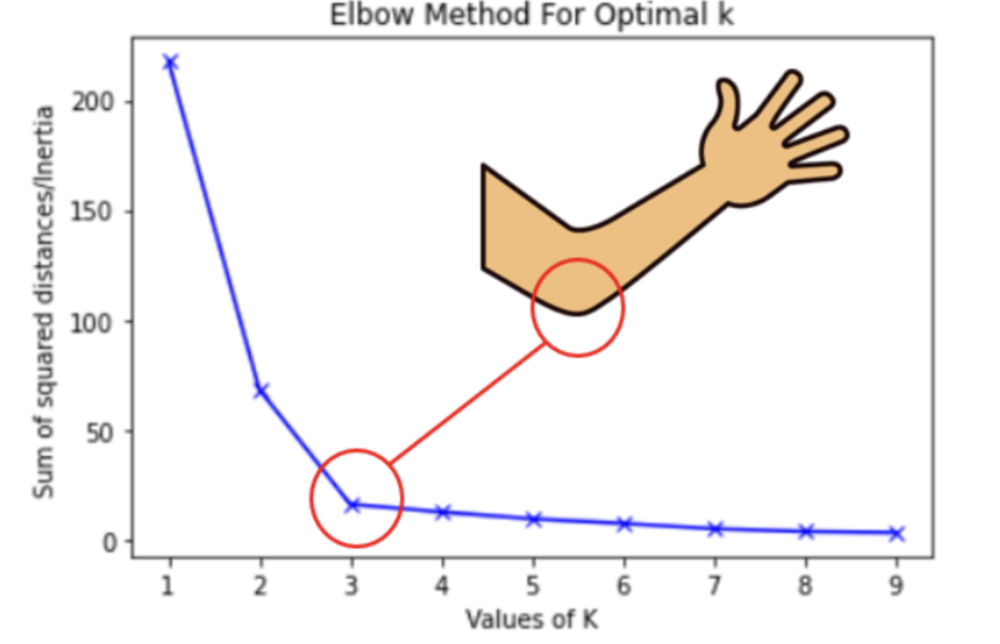

In [ ]:
tf.keras.preprocessing.image.load_img(os.path.join(images_path, 'elbow_method_for_optimal_K.png'))

In [ ]:
# np.argmin(inertia)

In [ ]:
inertia['Average Cluster Inertia'].argmin()

5

In [ ]:
optimal_K = K_hyperparameters[inertia['Average Cluster Inertia'].argmin()]

optimal_K

7

In [ ]:
# Perform the clustering with the optimal K

In [ ]:
%%time

from sklearn.cluster import KMeans

# Select the covariates we want to perform the clustering on

k_means = KMeans(n_clusters=optimal_K,
               init='k-means++',
               n_init=10,
               max_iter=300,
               tol=0.0001,
               verbose=0,
               random_state=42,
               copy_x=True,
               algorithm='elkan')

# k_means.fit(uber_August_2014_trip_data_covariates_normalized)
k_means.fit(uber_August_2014_trip_data_covariates)


uber_August_2014_trip_data['Cluster'] = k_means.labels_

CPU times: user 13.5 s, sys: 2.45 s, total: 15.9 s
Wall time: 13.9 s


In [ ]:
uber_August_2014_trip_data

,Date/Time,Lat,Lon,Base,Date,Cluster
0,8/1/2014 0:03:00,40.7366,-73.9906,B02512,2014-08-01,1
1,8/1/2014 0:09:00,40.7260,-73.9918,B02512,2014-08-01,1
2,8/1/2014 0:12:00,40.7209,-74.0507,B02512,2014-08-01,1
3,8/1/2014 0:12:00,40.7387,-73.9856,B02512,2014-08-01,1
4,8/1/2014 0:12:00,40.7323,-74.0077,B02512,2014-08-01,1
...,...,...,...,...,...,...
829270,8/31/2014 23:55:00,40.7552,-73.9753,B02764,2014-08-31,0
829271,8/31/2014 23:55:00,40.7552,-73.9753,B02764,2014-08-31,0
829272,8/31/2014 23:55:00,40.7617,-73.9788,B02764,2014-08-31,0
829273,8/31/2014 23:59:00,40.7395,-73.9889,B02764,2014-08-31,1


---
---

<br>
<font size="+1" style="color:red">
<ul>
<font color="blue"><li>In summary:</li>
<br>
<ul>
    <font color="blue"><li>The number of desired clusters, $K$, is chosen by the user.</li>
    <br>
    <li>The algorithm develops clusters by iteratively assigning observations to the nearest cluster mean until the cluster assignments stabilize.</li>
    <br>
    <li>Business-related decisions typically control the choice of $K$.</li>
    <br>
</ul>
</ul>
</font>

$\square$

---
---

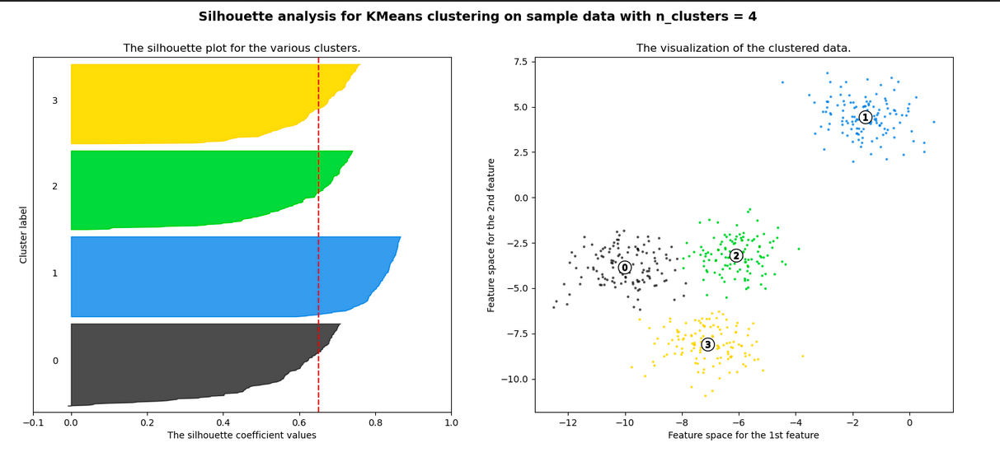

In [ ]:
tf.keras.preprocessing.image.load_img(os.path.join(images_path, 'silhouette_plots_I.png'))

### Quantifying the Quality of Clusters: <a href="https://scikit-learn.org/dev/modules/generated/sklearn.metrics.silhouette_score.html">Silhouette Coefficients</a> Plot

---
---

<br>
<font size="+1">
    <ul>
        <font color="red"><li style="color:red">Another <b>intrinsic metric</b> that can be used to evaluate the quality of a clustering is <b>silhouette score analysis</b>.</li></font>
        <br>
        <li>Silhouette score analysis can be used as a graphical tool to plot a measure of how tightly the observations are grouped per cluster.</li>
        <br>
        <li>This analysis requires the computation of a <a href="https://scikit-learn.org/dev/modules/generated/sklearn.metrics.silhouette_score.html">silhouette coefficient</a> for each observation $X_i$ in our data, calculated as follows:</li>
        <br>
        <ol>
            <li>Calculate the <b>cluster cohesion $\iff$ <u>within-cluster similarity</u></b>, $a_i$, as the average distance between an observation $X_i$ and all other points in the same cluster.</li>
            <br>
            <li>Calculate the <b>cluster separation $\iff$ <u>between-cluster dissimilarity</u></b>, $b_i$, from the next closest cluster as the average distance between the observation $X_i$ and all examples in the nearest cluster.</li>
            <br>
            <li>Calculate the <b>silhouette coefficient</b> $s_i$ as the difference between cluster cohesion and cluster separation divided by the greater of the two: $$s_i = \frac{b_i - a_i}{\max\{a_i, b_i\}}, $$ and note $$-1 \leq s_i \leq 1, $$ and $$s_i = 0 \iff b_i = a_i.$$ </li>
            <br>
        </ol>
        <li>We get close to an ideal silhouette score of 1 if the between-cluster dissimilarity is much larger than the within-cluster similarity $$b_i >> a_i.$$</li>
        <br>
        <li>In scikit-learn, use <a href="https://scikit-learn.org/dev/modules/generated/sklearn.metrics.silhouette_samples.html">sklearn.metrics.silhouette_samples()</a> to get the silhouette coefficient for each sample, and use <a href="https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html">sklearn.metrics.silhouette_score()</a> to get the average silhouette coefficient over all samples.</li>
        <br>
        <li>The silhouette score $s = \bar{s} = \frac{1}{n}\sum_{i=1}^n s_i$, has the following properties.</li>
        <br>
        <ul>
          <li>The best value is 1 and the worst value is -1. </li>
          <br>
          <li>Values near 0 indicate overlapping clusters.</li>
          <br>
          <li>Negative values generally indicate that a sample has been assigned to the wrong cluster, as a different cluster is more similar.</li>
          <br>
        </ul>
        <font color="red"><li><b>Now that we have some statistical intrinsic metric-based ways of analyzing the number of clusters and the quality of those clusters, we will analyze our clusters through an interpretable lens.</b></li></font>
        <br>
        <font color="blue"><li><b>Note, this silhouette coefficient analysis is computationally intensive due to the computation of the pairwise distances per cluster and and with neighboring clusters; for large data sets, it becomes infeasible.</b></li></font>
        <br>
        <li>For more, see <a href="https://en.wikipedia.org/wiki/Silhouette_(clustering)">here</a>.</li>
        <br>        
    </ul>
</font>

$\square$

---
---

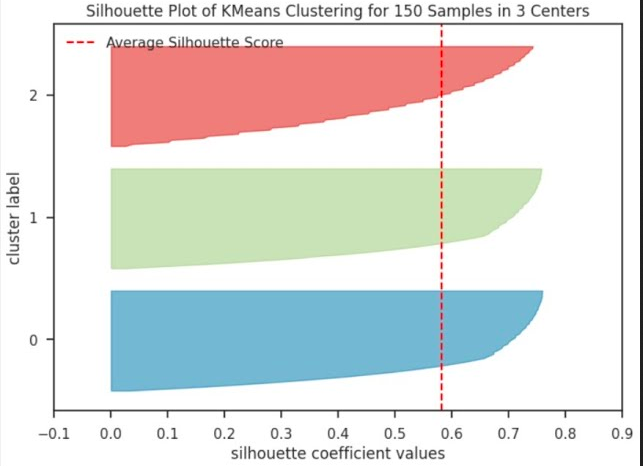

In [ ]:
tf.keras.preprocessing.image.load_img(os.path.join(images_path, 'silhouette_plots_II.png'))

In [ ]:
uber_August_2014_trip_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829275 entries, 0 to 829274
Data columns (total 6 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   Date/Time  829275 non-null  object        
 1   Lat        829275 non-null  float64       
 2   Lon        829275 non-null  float64       
 3   Base       829275 non-null  object        
 4   Date       829275 non-null  datetime64[ns]
 5   Cluster    829275 non-null  int32         
dtypes: datetime64[ns](1), float64(2), int32(1), object(2)
memory usage: 34.8+ MB


In [ ]:
uber_August_2014_trip_data_covariates.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829275 entries, 0 to 829274
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Lat     829275 non-null  float64
 1   Lon     829275 non-null  float64
dtypes: float64(2)
memory usage: 12.7 MB


In [ ]:
## The silhouette score is computationally intensive

In [ ]:
%%time

# We will first calcluate the average silhouette coefficient across all samples to get an aggregate measure of how good the clustering is performing

from sklearn.metrics import silhouette_score

# sklearn.metrics.silhouette_score(X, labels), where X = feature array

avg_silhouette_coeff = silhouette_score(uber_August_2014_trip_data_covariates, uber_August_2014_trip_data['Cluster'])

avg_silhouette_coeff

CPU times: user 2h 7min 27s, sys: 37min 9s, total: 2h 44min 37s
Wall time: 2h 17min 47s


0.4255627367587106

In [ ]:
%%time

# Next, we'll calculate the silhouette coefficient for all samples and create a silhouette coefficient plot to qualitatively evaluate the quality of our clusters

# sklearn.metrics.silhouette_samples(X, labels), where X = feature array

from sklearn.metrics import silhouette_samples

uber_August_2014_trip_data['silhouette_coeff'] = silhouette_samples(uber_August_2014_trip_data_covariates, uber_August_2014_trip_data['Cluster'])

uber_August_2014_trip_data.to_csv(os.path.join(data_path, 'uber_2014_trip_data_clustering.csv'), index=False)

CPU times: user 2h 3min 38s, sys: 35min 44s, total: 2h 39min 23s
Wall time: 2h 11min 27s


In [ ]:
uber_August_2014_trip_data = pd.read_csv(os.path.join(data_path, 'uber_2014_trip_data_clustering.csv'))

<StemContainer object of 3 artists>

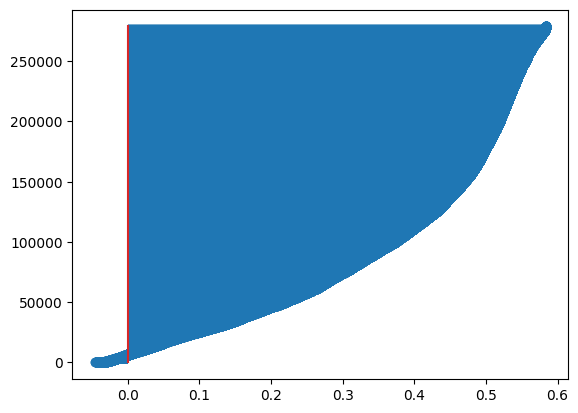

In [ ]:
ith_cluster_silhouette_values = uber_August_2014_trip_data.loc[uber_August_2014_trip_data['Cluster'] == 0, 'silhouette_coeff']

# Sort the silhouette values
plt.stem(ith_cluster_silhouette_values.sort_values(ascending=True).reset_index(drop=True),
         orientation='horizontal')

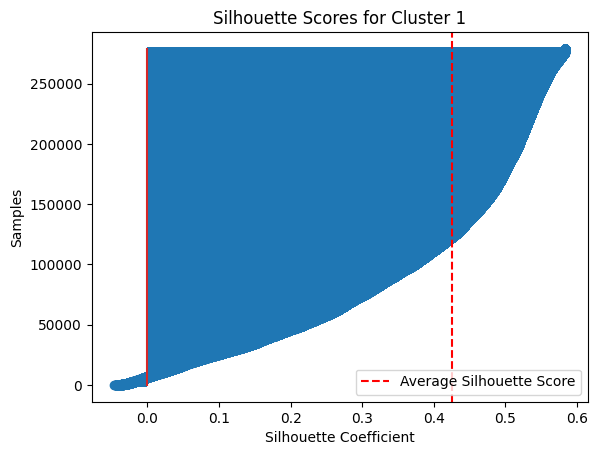

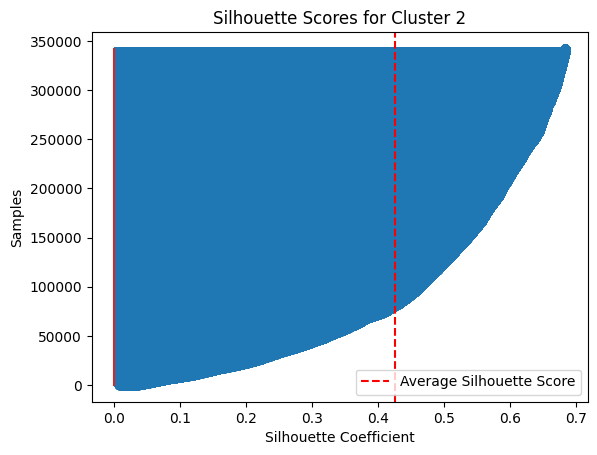

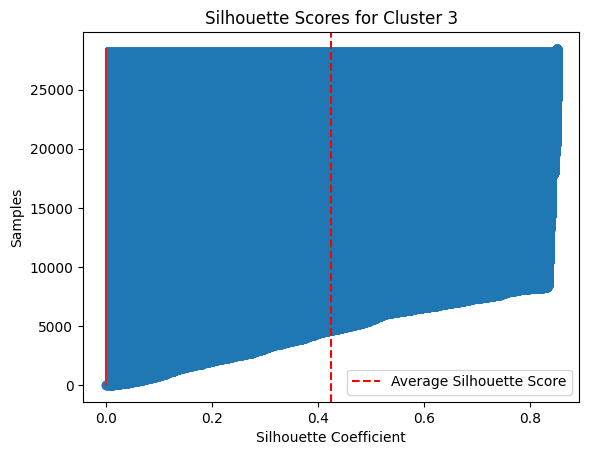

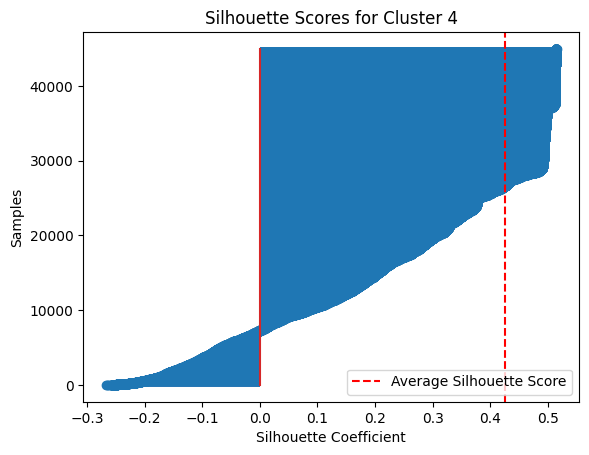

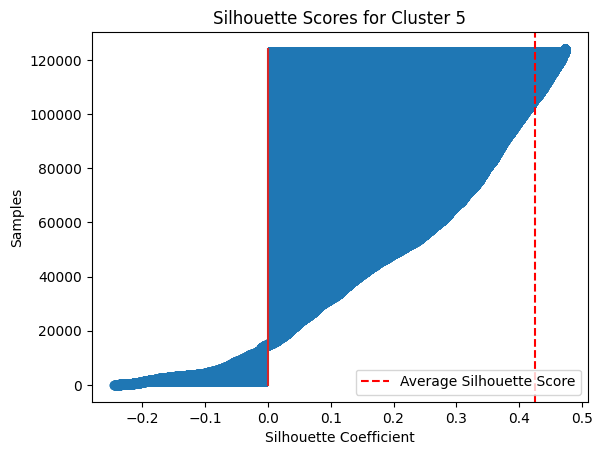

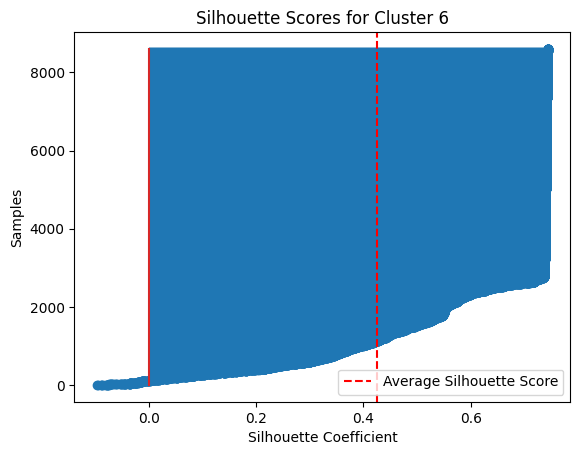

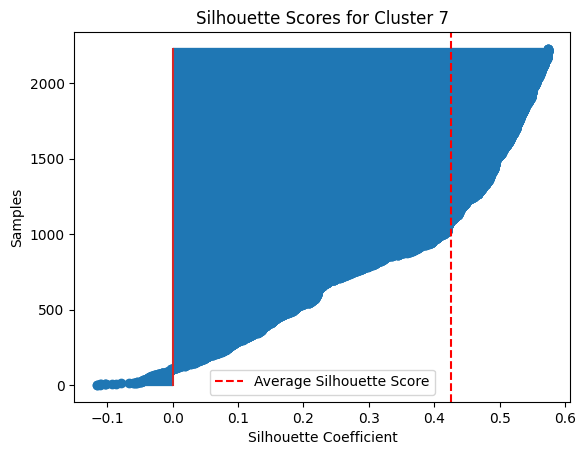

CPU times: user 47.3 s, sys: 1.9 s, total: 49.2 s
Wall time: 51.9 s


In [ ]:
%%time

n_clusters = 7

# Create a figure
# fig, ax = plt.subplots(figsize=(10, 6))

# Loop through each cluster and plot the silhouette scores as bars
for i in range(n_clusters):
    # Get silhouette scores for the current cluster
    ith_cluster_silhouette_values = uber_August_2014_trip_data.loc[uber_August_2014_trip_data['Cluster'] == i, 'silhouette_coeff']

    # Sort the silhouette values
    plt.stem(ith_cluster_silhouette_values.sort_values(ascending=True).reset_index(drop=True), orientation='horizontal')

    # Add labels and a vertical line for average silhouette score
    plt.axvline(x=0.4255627367587106, color="red", linestyle="--", label='Average Silhouette Score')
    plt.title(f"Silhouette Scores for Cluster {i+1}")
    plt.xlabel("Silhouette Coefficient")
    plt.ylabel("Samples")
    plt.legend()
    plt.show()

In [ ]:
# %%time

# uber_August_2014_trip_data.groupby('Cluster')['silhouette_coeff'].apply(lambda x: x.sort_values(ascending=False)).droplevel(1, axis=0).plot(kind='barh')

# plt.axvline(x=avg_silhouette_coeff, color='red', linestyle='--', label='Average Silhouette Coefficient')  # Vertical line
# plt.xlabel('Silhouette Coefficient')
# plt.ylable('Cluster')
# plt.legend()
# plt.show()

---
---

<br>
<ul>
    <li>This silhouette coefficient plot per cluster allows us to see how the per obervation coefficients behave.</li>
    <br>
    <li>Remember,</li>
    <br>
    <ul>
      <li>if the silhouette coefficients are not close to zero and are approximately equally far away from the average silhouette coefficient, <b>per cluster</b>, then this is an indicator of <b>good clustering</b>,</li>
      <br>
      <ul>
        <li>in other words if for every cluster, the silhouettes are similar to one another in terms of length and width, then it is likely a good cluster,</li>
        <br>
      </ul>
      <li>if the silhouette coefficients are closer to zero, or have visibly different lengths and widths, then this is <b>evidence of a relatively bad</b>, or at least <b>suboptimal</b> clustering.</li>
      <br>
    </ul>
</ul>

$\square$

---
---

$\rule{800pt}{20pt}$

# Visualize and Interpret the Clusters
<br>
<font size="+1">
    <ul>
        <li>In this example, there are two covariates, latitude and longitude, which makes it a relatively simple exercise to visualize each observation's cluster assignment as well as the cluster means.</li>
        <br>
        <li>The resulting grouping from the K-means clustering algorithm is what we will interpret as the hotspots for Uber pickups in NYC in August of 2014.</li>
        <br>
        <li>The two most important outputs of the K-means clustering algorithm are</li>
        <br>
        <ul>
            <li>the sizes of the clusters</li>
            <br>
            <li>and the means (centroids) of the clusters.</li>
            <br>
        </ul>
    </ul>
</font>

In [ ]:
# Plot the centroids

In [ ]:
cluster_centers = pd.DataFrame(k_means.cluster_centers_,
                               columns=['Latitude', 'Longitude'])

cluster_centers

,Latitude,Longitude
0,40.767630,-73.971010
1,40.731434,-73.997585
2,40.660925,-73.782544
3,40.798312,-73.873508
4,40.686534,-73.963249
5,40.699977,-74.200753
6,40.769594,-73.466627


In [ ]:
from matplotlib import cm

In [ ]:
normalized_labels = k_means.labels_ / k_means.labels_.max()

cmap = cm.rainbow(normalized_labels)

In [ ]:
#cmap_unique = cm.rainbow(np.unique(k_means.labels_ / k_means.labels_.max()))
#np.unique(k_means.labels_ / k_means.labels_.max())

<Axes: xlabel='Lat', ylabel='Lon'>

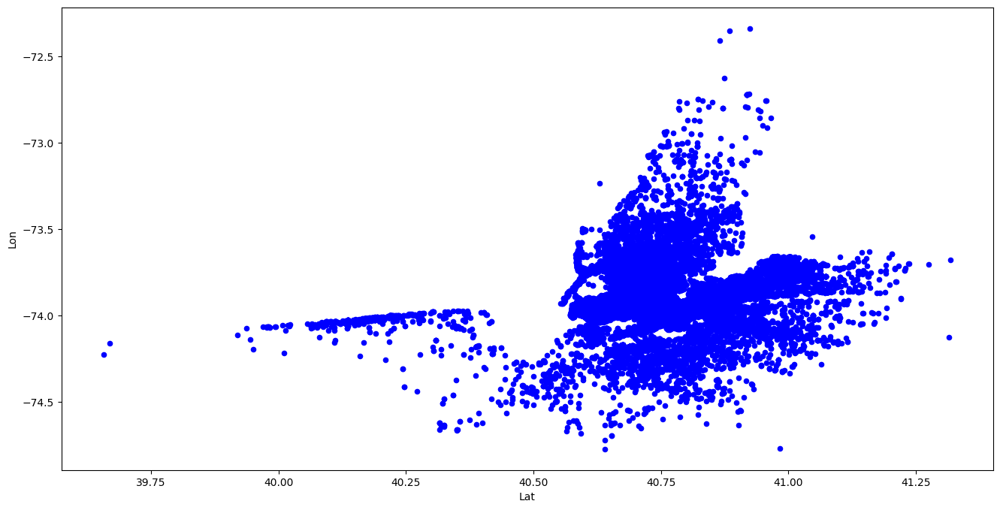

In [ ]:
uber_August_2014_trip_data_covariates.plot(kind='scatter',
                                          x='Lat',
                                          y='Lon',
                                          #alpha=0.08,
                                          color='blue', #k_means.labels_.astype(float),
                                          figsize=(16,8))

<Axes: xlabel='Lat', ylabel='Lon'>

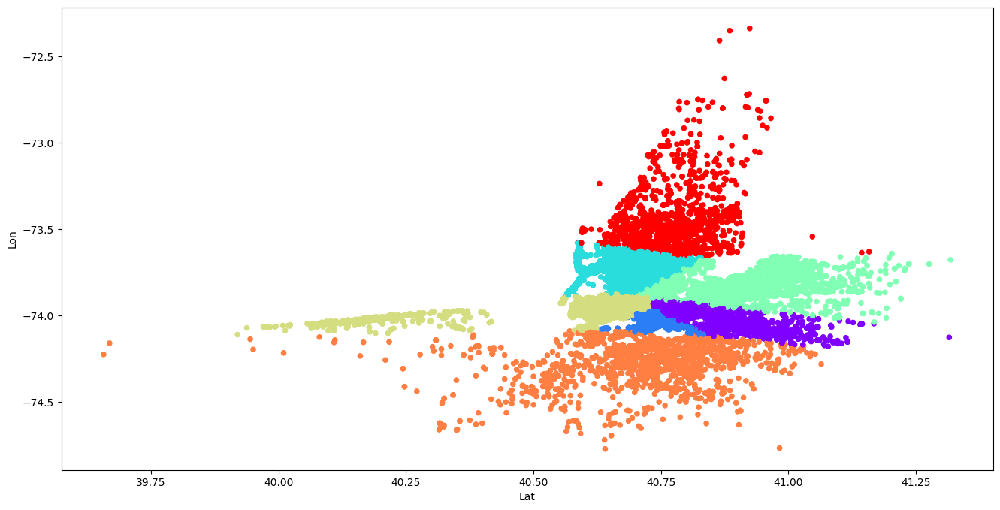

In [ ]:
uber_August_2014_trip_data_covariates.plot(kind='scatter',
                                          x='Lat',
                                          y='Lon',
                                          #alpha=0.08,
                                          color=cmap, #k_means.labels_.astype(float),
                                          figsize=(16,8))

<Axes: xlabel='Latitude', ylabel='Longitude'>

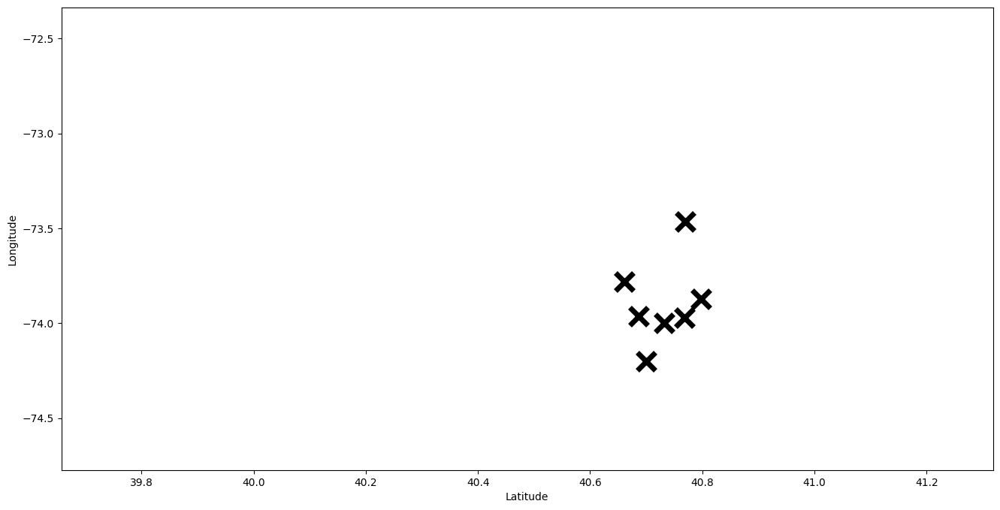

In [ ]:
cluster_centers.plot(kind='scatter',
                    x='Latitude',
                    y='Longitude',
                    marker='x',
                    color='black',
                    s=300,
                    linewidth=5,
                    xlim=[uber_August_2014_trip_data_covariates['Lat'].min(), uber_August_2014_trip_data_covariates['Lat'].max()],
                    ylim=[uber_August_2014_trip_data_covariates['Lon'].min(), uber_August_2014_trip_data_covariates['Lon'].max()],
                    figsize=(16,8))

<Axes: xlabel='Latitude', ylabel='Longitude'>

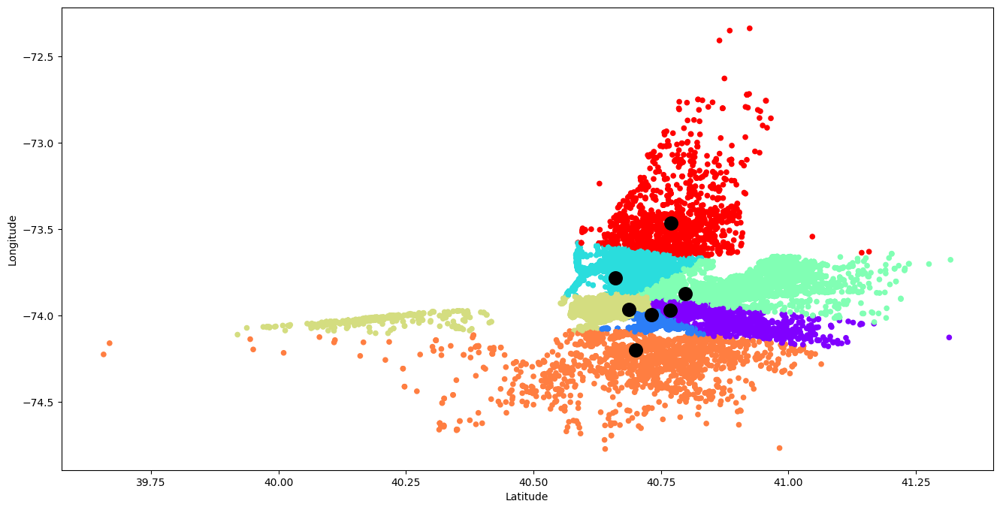

In [ ]:
fig = uber_August_2014_trip_data_covariates.plot(kind='scatter',
                                                  x='Lat',
                                                  y='Lon',
                                                  #alpha=0.08,
                                                  color=cmap, #k_means.labels_.astype(float),
                                                  figsize=(16,8))

cluster_centers.plot(kind='scatter',
                    x='Latitude',
                    y='Longitude',
                    marker='.',
                    color='black',
                    s=300,
                    linewidth=5,
                    figsize=(16,8),
                    ax=fig)

<Axes: xlabel='Latitude', ylabel='Longitude'>

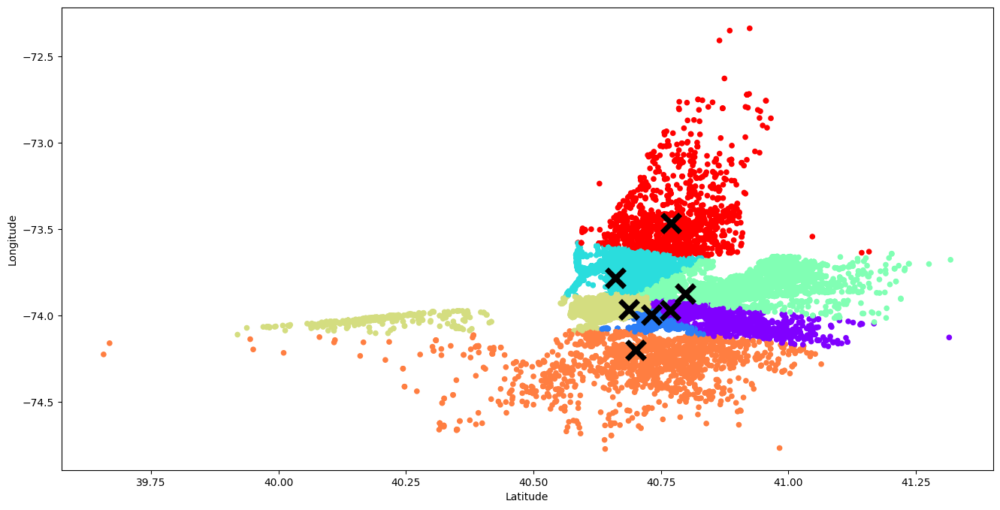

In [ ]:
#fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(16,16))
#ax = ax.flatten()

fig = uber_August_2014_trip_data_covariates.plot(kind='scatter',
                                                  x='Lat',
                                                  y='Lon',
                                                  #alpha=0.08,
                                                  color=cmap, #k_means.labels_.astype(float),
                                                  figsize=(16,8))

cluster_centers.plot(kind='scatter',
                    x='Latitude',
                    y='Longitude',
                    marker='x',
                    color='black',
                    s=300,
                    linewidth=5,
                    figsize=(16,8),
                    ax=fig)

---
---

<br>
<font size="+1">
    <ul>
        <li>Note that not every cluster is obviously and cleanly separated.</li>
        <br>
    </ul>
</font>

---
---

## Centriods in Context
<br>
<font size="+1">
    <ul>
        <li>To give context to the centroids, which were computed from geospatial covariates (latitude and longitude), it will be useful to visualize them in the context of a map.</li>
        <br>
        <li>One way to create and plot in maps is through <a href="https://python-visualization.github.io/folium/">Folium</a>, which allows for interactivity and is helpful in dashboard building as well.</li>
        <br>
        <ul>
            <li>For the technically curious, Folium combines Python and <a href="https://leafletjs.com/">Leaflet.js</a>, which is an open-source JavaScript library for mobile-friendly interactive maps.</li>
            <br>
            <li>Using Folium, you can manipulate your data in Python and visualize it in a Leaflet map.</li>
            <br>  
        </ul>
    </ul>
</font>

In [ ]:
# ! conda install -c conda-forge folium --yes

In [ ]:
! pip install folium

In [ ]:
import folium

In [ ]:
k_means.cluster_centers_

array([[ 40.76763003, -73.97101037],
       [ 40.73143438, -73.99758543],
       [ 40.66092504, -73.78254444],
       [ 40.79831179, -73.8735081 ],
       [ 40.6865342 , -73.96324859],
       [ 40.69997732, -74.20075322],
       [ 40.76959376, -73.46662719]])

In [ ]:
# Converting centroid into lists

centroid = cluster_centers.values.tolist()

In [ ]:
centroid

[[40.767630031296875, -73.9710103665484],
 [40.73143437731907, -73.9975854257186],
 [40.660925036927615, -73.78254444327213],
 [40.79831179006142, -73.87350809826913],
 [40.686534197312305, -73.96324858533838],
 [40.69997732450023, -74.20075321943283],
 [40.76959376401974, -73.46662718707941]]

In [ ]:
# Plotting the centroids on google map using Folium library.

# Define the map object
map_ = folium.Map(location=centroid[0], zoom_start = 9)

for center in centroid:
    # Assign a marker to the map
    folium.Marker(location = center,
                  popup = center).add_to(map_)
map_

## Grouping and Visualizing the Total Number Pickups by Cluster
<br>
<font size="+1">
    <ul>
        <li>It is important to investigate if the clusters are <i>balanced</i>.</li>
        <br>
        <li>Imbalanced clusters can result from distant outliers, or from groups of observations that are very distinct from the rest of the data. This will typically require further investigation.</li>
        <br>
        <li>Additionally, it is important to investigate the similarities and differences of the covariates of each observation, for every cluster.</li>
        <br>
        <li>Which cluster receives the largest number of ride requests?</li>
        <br>
    </ul>
</font>

In [ ]:
# Store the cluster centroids
k_means.cluster_centers_

array([[ 40.76763003, -73.97101037],
       [ 40.73143438, -73.99758543],
       [ 40.66092504, -73.78254444],
       [ 40.79831179, -73.8735081 ],
       [ 40.6865342 , -73.96324859],
       [ 40.69997732, -74.20075322],
       [ 40.76959376, -73.46662719]])

In [ ]:
uber_August_2014_trip_data.loc[:, 'Cluster']\
.value_counts()\
.sort_index()

,count
Cluster,
0,278845
1,342089
2,28455
3,44970
4,124083
5,8604
6,2229


<br>
<font size="+1">
    <ul>
        <li><a href="https://seaborn.pydata.org/generated/seaborn.catplot.html">Seaborn can help with plotting categorical data.</a></li>
        <br>
    </ul>
</font>

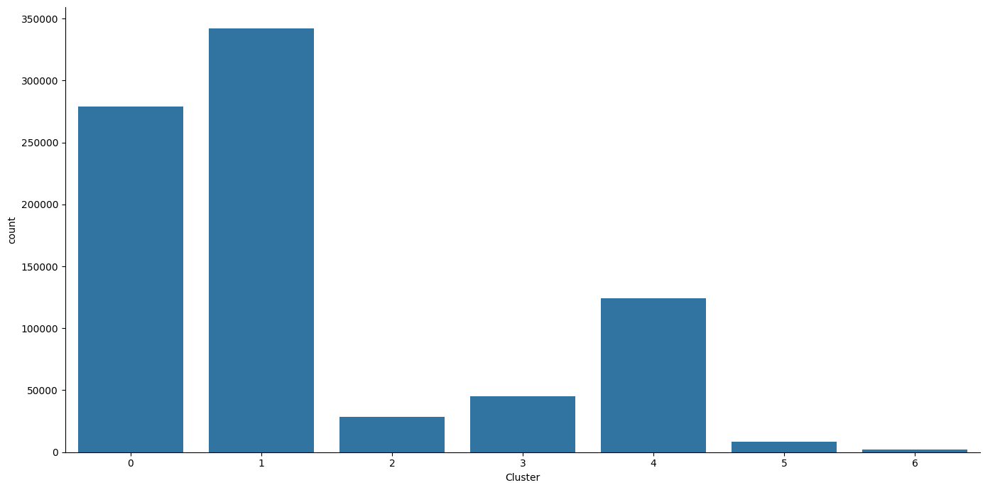

In [ ]:
import seaborn as sns

sns.catplot(data=uber_August_2014_trip_data,
              x='Cluster',
              kind='count',
              height=7,
              aspect=2)

In [ ]:
new_location = [(40.6556, -73.5631)]

k_means.predict(new_location)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


array([6], dtype=int32)

<font size="+1" style="color:blue">
    <ul>
        <font color="blue"><li>What do we observe and how can these observations be helpful to Uber?</li>
        <br>
        <ul>
            <font color="blue"><li>We observe a map of New York with the cluster centers plotted on the map.</li>
            <br>
            <li>We observe which clusters are most populated.</li>
            <br>
            <li>We believe a new rider's request can be assigned to a particular cluster.</li>
            <br>
            <li>Uber can use these centroids as their hubs. Whenever Uber receives a new ride request, they can check the rider's location with the centroids. Once the rider's location is categorized, then Uber can make the ride request available to riders located in that particular cluster to enhance rider-driver matching efficiency.</li>
            <br>
            <li>Additionally, Uber can incentivize drivers, with their pricing mechanisms, to stay around hotspots (clusters) that have a high rider demand.</li>
            <br>
            <li>Uber can make this process dynamic by considering the dimension of time, which we have left out of this analysis.</li>
            <br>
            <li>All of these recommendations will enhance Uber's matching and pricing mechanisms and increase rider-driver matching efficiency.</li>
            <br>
        </ul>
    </ul>
</font>

$\rule{800pt}{20pt}$

# What Have We Covered?
<br>
<font size="+1">
  <ol>
    <li>We first discussed the business of Uber through the lens of a platform that offers an optimal matching service.</li>
    <br>
    <li>We then looked at panel data representing Uber rides in NYC and extracted time-based features from the timestamp.</li>
    <br>
    <li>Next, we analyzed rider patterns across different time periods and found some notable trends.</li>
    <br>
    <li>We learned how to cluster data using the K-means algorithm and saw a few different statistical methods to determine the quality of the clusters.</li>
    <br>
    <li>Finally, we were able to plot our data on a map to visually inspect and interpret our clusters.</li>
    <br>
    <li>Next, we will learn about causal inference and the potential outcomes model and how we can attempt to explain our data and establish causal relationships using regressions.</li>
    <br>
  </ol>
</font>

$\rule{800pt}{20pt}$

$\rule{800pt}{20pt}$

# Miscellaneous: NOT NECESSARY TO KNOW

## Agglomerative Hierarchical Clustering

- When should we use hierarchical clustering versus K-means clustering?

  - Size of data set:

    - Hierarchical clustering is better for smaller datasets because it has a higher computational cost than K-means.
    
    - K-means is more efficient for large datasets with distinct spherical clusters.

  - Number of clusters:

    - If you know the number of clusters in the dataset, but not which group each belongs to, use K-means.
    
    - If you don't know the number of clusters, use hierarchical clustering.

  - Shape of the clusters:

    - Hierarchical clustering is more flexible in terms of cluster shape.

    - If you want your clusters to have a spherical shape, use K-means clustering.

  - Interpretability:

    - Hierarchical clustering results are more interpretable and informative than K-means.

  - Having prior beliefs on cluster membership:
  
    - If the distinctions are based on prior beliefs about cluster membership, use hierarchical clustering.

  - Outliers in the data:
    
    - K-means treats all data points equally, so it can be sensitive to outliers.

### Organizing Clusters as a Hierarchical Tree



$\rule{800pt}{20pt}$

## Density-Based Spatial Clustering

- DBSCAN = density-based spatial clustering of applications with noise

## **Explaining Cluster Membership**

- Explaining cluster membership involves understanding what characteristics or features influence why an observation belongs to a specific cluster. While clustering algorithms like **k-means** or **hierarchical clustering** group data points based on similarity, they do not inherently provide information on which features drive cluster assignment. To gain this understanding, we can use regression models, especially when cluster labels are treated as the target variable.

---


### **Applications**
1. **Customer Segmentation**:
   - Use logistic regression to determine which demographic or behavioral factors drive customers into different segments.
   
2. **Risk Profiling**:
   - In finance, clusters may represent different risk profiles. Regression can explain which financial metrics (e.g., debt-to-income ratio, credit score) are significant for each risk category.

3. **Market Segmentation**:
   - In marketing, multinomial logistic regression can reveal which customer attributes (e.g., age, income, location) are most influential in determining market segment membership.

---

### **Advantages**
- **Interpretability**: Regression models (logistic/multinomial) offer interpretable coefficients.
- **Feature Importance**: You can identify the most significant features influencing cluster membership.
  
### **Disadvantages**
- **Assumption Dependence**: Regression models assume a specific functional form (linear or logistic).
- **Loss of Unsupervised Nature**: Explaining cluster membership shifts the task from unsupervised (clustering) to supervised (regression).

---
---



### Multinomial Logistic Regression

**Approach 1: Logistic Regression for Binary Clusters**
If the clustering process results in two clusters (binary clustering), you can use **logistic regression** to model the probability of a data point belonging to one cluster over the other.

- **Dependent Variable**: Cluster membership (e.g., 0 or 1).
- **Independent Variables**: Features used for clustering.

The logistic regression model will provide coefficients that show how changes in the features influence the likelihood of belonging to a specific cluster.

---

**Approach 2: Multinomial Logistic Regression for Multiple Clusters**
For more than two clusters, you can use **multinomial logistic regression**. This model extends logistic regression to handle multiple classes (clusters).

- **Dependent Variable**: Cluster labels (e.g., Cluster 1, Cluster 2, Cluster 3).
- **Independent Variables**: Features from the dataset.

The output includes:
1. **Coefficients for each feature** and cluster combination.
2. **Odds ratios**, explaining how each feature influences the odds of belonging to a specific cluster compared to a reference cluster.

---

- <a href="https://en.wikipedia.org/wiki/Multinomial_logistic_regression">Multinomial Logistic Regression</a>

- <a href="https://www.statsmodels.org/dev/generated/statsmodels.discrete.discrete_model.MNLogit.html">statsmodels.discrete.discrete_model.MNLogit()</a>

- <a href="https://michael-fuchs-python.netlify.app/2019/11/15/multinomial-logistic-regression/">Multinomial logistic regression with Statsmodels</a>

### Decision Trees

**Approach 3: Decision Trees or Random Forests**
- **Decision Trees** or **Random Forests** can also help explain cluster membership. These models provide feature importance scores, indicating which features are most influential in predicting cluster assignment.
  
  - **Benefit**: They capture nonlinear relationships and interactions between features.
  - **Output**: The tree structure or feature importance scores provide insights into the key factors driving cluster membership.


## Loc2Vec Embeddings

---
---

- <a href="https://sentiance.com/loc2vec-learning-location-embeddings-w-triplet-loss-networks">Loc2Vec: Learning location embeddings with triplet-loss networks</a>

  - <a href="https://www.youtube.com/watch?v=SUM670TPTQ0">Vincent Spruyt: Loc2Vec: Self-supervised metric learning through triplet-loss</a>

- <a href="https://medium.com/@sureshr/loc2vec-a-fast-pytorch-implementation-2b298072e1a7">Loc2vec — a fast pytorch implementation</a>

  - <a href="https://github.com/angus-spence/loc2vec">loc2vec GitHub</a>

- <a href="https://hal.science/hal-02357778/document">Location Embedding and Deep Convolutional Neural
Networks for Next Location Prediction</a>

---
---

## Additional Resources If Interested
<br>
<font size="+1">
    <ul>
        <li><a href="https://www.uber.com/blog/simulated-marketplace/">Gaining Insights in a Simulated Marketplace with Machine Learning at Uber
</a></li>
        <br>
        <li><a href="https://eng.lyft.com/matchmaking-in-lyft-line-9c2635fe62c4">Matchmaking in Lyft Line</a></li>
        <br>
        <li><a href="https://blogs.cornell.edu/info2040/2019/10/23/uber-ride-sharing-a-matching-market/">Uber Ride-Sharing: A Matching Market?</a></li>
        <br>
        <li><a href="https://www.uber.com/us/en/marketplace/matching/">How Does Uber Match Riders With Drivers?</a></li>
        <br>
    </ul>
</font>

## Simpson's Paradox Toy Example

Simpson's Paradox is an interesting phenomenon where a trend appears in different groups of data but reverses or disappears when the groups are combined. In the context of linear regression, it can happen when a confounding variable affects the results.

Here's a Python example in `statsmodels` illustrating Simpson's Paradox where:

- Regressing `Y` on `X` shows a positive slope.
- When controlling for `Z`, the slope of `X` becomes negative.

For a relatable business story, consider a scenario where a company wants to evaluate the relationship between *advertising spending* (`X`) and *sales revenue* (`Y`). Suppose the company operates in two regions, `Region A` and `Region B` (represented by `Z`), which have different market dynamics.

### Business Story

1. **Initial Observation**: When looking at the overall data (without distinguishing by region), it appears that higher advertising spending is associated with higher sales revenue (positive slope).
2. **Controlling for Region**: Once we account for the region, we find that increasing advertising spending actually decreases sales revenue in each region (negative slope). This could happen if advertising is more efficient in one region due to market saturation or brand recognition, while in the other region, increased spending leads to diminishing returns.

This paradox may reveal that the general relationship is misleading without controlling for the region.



### Explanation

1. **Combined Regression**: When regressing `Y` (sales revenue) on `X` (advertising spending) without considering the region, the model shows a positive slope. This suggests that, overall, higher spending increases revenue.
  
2. **Controlling for Region**: When we control for `Z` (region), we find that each region actually has a negative relationship between `X` and `Y`. This could indicate that increased advertising spending within each region has diminishing returns or is less effective.

3. **Visualization**: The plot shows that each region has a negative relationship between advertising and sales, despite the combined regression line showing a positive trend, illustrating Simpson's Paradox.

In [ ]:
data

NameError: name 'data' is not defined

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Set random seed for reproducibility
np.random.seed(0)
size = 100

# Generate data for Region A
region_a = pd.DataFrame({
    'X': np.random.normal(200, 50, size),
    'Z': 'Region A'
})
region_a['Y'] = 250 + (-0.5) * region_a['X'] + np.random.normal(0, 20, size)

# Generate data for Region B with a different relationship
region_b = pd.DataFrame({
    'X': np.random.normal(100, 20, size),
    'Z': 'Region B'
})
region_b['Y'] = 150 + (-0.4) * region_b['X'] + np.random.normal(0, 15, size)

# Combine both regions into a single dataset
data = pd.concat([region_a, region_b])

# Without controlling for region (Z), regress Y on X
X_combined = sm.add_constant(data['X'])
model_combined = sm.OLS(data['Y'], X_combined).fit()
print("\n\nRegression results without controlling for Region (Z):\n\n")
print(model_combined.summary())

# Controlling for Region (Z) using dummy variables
data = pd.get_dummies(data, drop_first=True)  # Creates a binary variable for Region B
X_control = sm.add_constant(data[['X', 'Z_Region B']]) #, 'Z_Region A']])
model_control = sm.OLS(data['Y'], X_control.astype(float)).fit()
print("\n\nRegression results controlling for Region (Z):\n\n")
print(model_control.summary())

# Plot the data for visualization
plt.figure(figsize=(10, 6))
plt.scatter(region_a['X'], region_a['Y'], color='blue', label='Region A')
plt.scatter(region_b['X'], region_b['Y'], color='orange', label='Region B')
plt.plot(data['X'], model_combined.predict(X_combined), color='green', label='Combined Regression')
plt.xlabel('Advertising Spending (X)')
plt.ylabel('Sales Revenue (Y)')
plt.title("Simpson's Paradox Visualization: Advertising vs. Sales Revenue")
plt.legend()
plt.show()

## Extensions
<br>
<font size="+1">
    <ul>
        <li>This is an example of a type of very real problem that has many questions that need to be answered for many different businesses.</li>
        <br>
        <li>If one is interested, this topic could be extended into a comprehensive project that is presentable to future employers.</li>
        <br>
        <li>Specifically, there are many questions (that have and haven't been addressed in this exam) that require the full spectrum of analytics (descriptive, predictive, and prescriptive) to sufficiently answer. (This is good news!)</li>
        <br>
        <li>A few ride-hailing data sources are:</li>
        <br>
        <ul>
            <li><a href="https://www.openstreetmap.org/#map=5/38.013/-95.845">Open Street Maps</a> can be used to reconstruct a real city network (for more, see <a href="https://gisgeography.com/openstreetmap-download-osm-data/">here</a> and <a href="https://planet.openstreetmap.org/">here</a>).</li>
            <br>
            <li><a href="https://www.nyc.gov/site/tlc/about/tlc-trip-record-data.page">New York City Taxi and Limousine Commission data set </a>. This massive data set contains all ride-sharing and taxi trips in NYC, starting from 2009, for a total of more than one billion rides.</li>
            <br>
            <li><a href="https://data.world/ride-austin">RideAustin</a> data set also contains lots of data related to surge pricing.</li>
            <br>
        </ul>
        <li>As well as <a href="https://towardsdatascience.com/uber-driver-schedule-optimization-62879ea41658">Uber Driver Schedule Optimization</a>, <a href="https://faculty.fuqua.duke.edu/ioconference/papers/2017/Castillo,%20Juan%20Camilo_Surge_07_17.pdf">Surge Pricing Solves the Wild Goose Chase</a>, and <a href="https://afi.io/blog/using-route-optimization-to-build-a-ride-share-dispatch-algorithm/">Using route optimization to build a ride share dispatch algorithm</a>.</li>
        <br>
    </ul>
</font>

$\square$

## Graph-Based Clustering

- Spectral clustering is a subset of graph-based clustering

## <a href="https://arxiv.org/pdf/2405.03083">Causal K-Means Clustering</a>

- <a href="https://www.google.com/url?sa=t&source=web&rct=j&opi=89978449&url=https://ww2.amstat.org/meetings/ichps/2020/onlineprogram/ViewPresentation.cfm%3Ffile%3D306644.pdf&ved=2ahUKEwi56Yj-6MmJAxUuLtAFHRWTHQgQFnoECBsQAQ&usg=AOvVaw3sI1IFnPexWaDZq5Y1ksWC">Causal Clustering: A new approach to analysis of treatment effect heterogeneity</a>

## Other Interesting Experiments with the Uber Data Set
<br>
<font size="+1">
    <ul>
        <li><a href="https://medium.com/analytics-vidhya/exploratory-data-analysis-of-uber-pickups-in-nyc-from-april-to-september-2014-ec78d5a35f78">EDA of Uber Pickups in NYC</a> with <a href="https://en.wikipedia.org/wiki/DBSCAN">DBSCAN Clustering Algorithm.</a></li>
        <br>
        <li><a href="https://github.com/AnisZakari/Uber_pickup_Challenge">Another good example.</a></li>
        <br>
        <li><a href="https://realpython.com/k-means-clustering-python/">Great extensions on K-Means clustering in Python.</a></li>
        <br>
    </ul>
</font>

Highly Clustered/Hotspot Areas

* While it can be useful to look at the raw data set of our heatmap and gain intuition, looking at snap shots doesn’t give us enough information to make good conclusions, and plotting hours of individual pick-ups just makes a mess.

* We want actionable conclusions from this data set, so we’ll need to be able to make quantitative comparisons between different regions in the city and we may not use the Bases column since they cover huge areas.

* We’ll implement the DBSCAN clustering method from scikit-learn instead of structured spatial binning.

* The K-Means algorithm is likely the most common clustering algorithm.

* But for spatial data, the DBSCAN algorithm is far superior in this kind of scenario where you are also using geographical data.

* The DBSCAN algorithm will group points together that meet a specified density metric.

* Basically, we’ll define a maximum distance to make two individual points count as neighbors, as well as a minimum number of neighbors for a group of points to qualify as a cluster.

* The algorithm will sort the points into groups which meet the criteria and discard all of the outliers.

* Once DBSCAN has identified all applicable clusters, we can easily calculate the centroid using the MultiPoint class from Shapely and plot the results.

* This allows us to precisely identify locations which experience a high volume of pick-ups during a specified time frame.

* By using the total number of pickups in an individual cluster as a metric for coloring the hot spot locations, we can visualize the intensity of a given hotspot in addition to it’s centroid.

* First, we’ll write a function which runs the clustering algorithm and returns the “hot spots.” We’ll get the coordinates of the centroid and the number of pickups in each cluster.

## <a href="https://blog.dominodatalab.com/creating-interactive-crime-maps-with-folium?_ga=2.156732411.1945776980.1653074621-768186976.1653074621">Creating Interactive Crime Maps with Folium</a>
<br>
<font size="+1">
    <ul>
        <li></li>
        <br>
    </ul>
</font>

## More Mathematical Details
<br>
<font size="+1">
    <ul>
        <li>Note:</li>
        <br>
        <ul>
            <li>PCA finds directions of maximum variation</li>
            <br>
            <li>Clustering finds groups of minimum variation within/per group, but maximum variation between groups.</li>
            <br>
        </ul>
    </ul>
</font>

<h3>K-Means Clustering</h3>

<h3>Hierarchical Clustering</h3>

<h2>Hierarchical Clustering</h2>

<h3>Terminology of Hierarchical Clustering</h3>

<h3>Dendrogram</h3>

<h3>Agglomerative Algorithm</h3>

<h3>Measures of Dissimilarity</h3>

<h2>Model-Based Clustering</h2>

- This should include clustering with Autoencoders

<h3>Multivariate Normal Distribution</h3>

<h3>Mixtures of Normals</h3>

<h3>Selecting the Number of Clusters</h3>

# <a href="https://streamlit.io/">Streamlit</a> for Data Apps

- <a href="https://streamlit.io/#install">Get started now</a>

  - <a href="https://share.streamlit.io/signup?ref=get-started-on-cloud">Sign up with GitHub</a>

    - <a href="https://share.streamlit.io/signup?ref=get-started-on-cloud">share.streamlit.io</a>

    - Sign in with a Source-Control account.

    - Upper right hand corner -> Share -> Copy Link

    - https://uscdsopractice.streamlit.app/

- <a href="https://docs.streamlit.io/develop/api-reference">Streamlit API</a>

- <a href="https://www.datacamp.com/tutorial/streamlit">DataCamp: Streamlit</a>

## Step 1: Go to <a href="https://streamlit.io/#install">Get Started Now</a> -> <a href="https://share.streamlit.io/signup?ref=get-started-on-cloud">Sign-up with GitHub</a>

  - You will need to create a GitHub account if you do not have one already.

    - <a href="https://github.com/austinpollok/uscdsopractice/tree/main">My GitHub</a>

  - This allows us to skip installation.
  
  - Instead of doing all of our development locally, we will deploy our data app using the <a href="https://streamlit.io/cloud">Streamlit Community Cloud</a>.

  - Take a look at the <a href="https://blog.streamlit.io/">community cloud posts</a> to see what is possible with this development framework.

  - We can also share our data app instantly.

In [ ]:
from IPython.display import IFrame, display
# https://drive.google.com/file/d/1lO3eelhlWLgmH4NPz-jGtFWh09viEVt5/view?usp=sharing
display(IFrame('https://drive.google.com/file/d/1lO3eelhlWLgmH4NPz-jGtFWh09viEVt5/preview',
               width=800, height=400))

## Step 2: Use a Template on <a href="https://share.streamlit.io/signup?ref=get-started-on-cloud">Streamlit Community Cloud</a> to Get Started

- Choose a blank template

- Choose name for a new GitHub repo

- Add an app URL

- Deploy the template

  - It will say "in the oven" and you will see your new blank template.

- Now go to your GitHub, see the repo, and start writing using the Streamlit codebase.




## Step 3: Go to GitHub and Write Your App in "streamlit_app.py"

- You can use GitHub codespaces to edit, you can edit the file directly, you can interface with GitHub through desk

- You can also write your code in a blank file and upload <a href="https://bebi103a.github.io/lessons/02/git_with_colab.html">GitHub with Google Colab</a>

### <a href="https://docs.streamlit.io/get-started/installation/community-cloud">Use Community Cloud to develop with GitHub Codespaces</a>

### Stop or Delete Your Codespace


- When you are done, remember to stop your codespace on GitHub to avoid any undesired use of your capacity.

- Go to <a href="https://github.com/codespaces">github.com/codespaces</a>.

- At the bottom of the page, all your codespaces are listed. Click the overflow menu icon ($\cdots$) for your codespace.

- Click "Stop codespace" if you'd like to return to your work later. Otherwise, click "Delete."

$\square$

## Step 4: Read-In Data From a Source

- In practice, this would be some data warehouse like Snowflake, Amazon S3, etc.

  - <a href="https://docs.streamlit.io/develop/tutorials/databases">Connect Streamlit to data sources</a>

    - <a href="https://www.snowflake.com/en/data-cloud/overview/streamlit-in-snowflake/">Streamlit in Snowflake</a>

  - <a href="https://docs.streamlit.io/develop/concepts/connections/connecting-to-data">Streamlit: Connecting to Data -> st.connection()</a>

- For simplicity, we will read our flat files from the Google Drive as follows:

  - <a href="https://discuss.streamlit.io/t/google-drive-csv-file-link-to-pandas-dataframe/8057">Use this as a guide</a>

- For more, see <a href="https://docs.streamlit.io/develop">Streamlit Develop</a>

## Step 5: Start Developing

- <a href="https://docs.streamlit.io/develop/api-reference/charts/st.plotly_chart">Plotly Charts in Streamlit</a>

In [ ]:
# Getting started with Streamlit in Python
# https://www.youtube.com/watch?v=sogNluduBQQ&list=PLv6Xu6O6acN4OTkGuuYCt1ZT45nsSLguY

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
! pip install streamlit

In [ ]:
! streamlit run /content/drive/MyDrive/01_DSO_545_Fall_2024/05_Robinhood/app.py

# Streamlit and Uber NYC Data with <a href="https://altair-viz.github.io/">Altair API</a>

- https://github.com/streamlit/demo-uber-nyc-pickups

- https://streamlit-demo-uber-nyc-pickups-streamlit-app-456wus.streamlit.app/



## Sanity Check
<br>
<font size="+1">
    <ul>
        <li style="color:red">How can K-means clustering help Uber perform optimal pricing and the optimal positioning of cars in order to serve their customers faster and grow their business, which comes from efficient matching of riders and drivers?</li>
    </ul>
</font>

In [ ]:
from jupyterquiz import display_quiz

<font size="+1">
    <ul>
        <li>What have we learned?</li>
        <br>
    </ul>
</font>

<span style="display:none" id="Q1">[
    {
        "question": "What have we learned in this notebook?",
        "type": "many_choice",
        "answers": [
            {
    "answer": "A little bit about Uber and some questions Uber must answer to improve their products and services.",
                "correct": true,
                "feedback": "Correct."
            },
            {
                "answer": "How to implement algorithmic exploratory data analysis using a particular clustering algorithm (K-means clustering).",
                "correct": true,
                "feedback": "Correct."
            },
            {
                "answer": "There is always a perfect way to choose the optimal number of clusters for your data.",
                "correct": false,
                "feedback": "This is never one perfect, one-size-fits-all, methodology for choosing hyperparameters This is where analysts make their mint by experimentation, trial and error, and exercising sound statistical judgement."
            },
            {
                "answer": "The best implementation of the K-means clustering algorithm is with an exact algorithm, rather than an approximate algorithm.",
                "correct": false,
                "feedback": "The exact algorithm is far too computationally expensive to implement, an approximate iterative algorithm must be used instead."
            },
            {
                "answer": "How to visualize clusters, compute their importance and density.",
                "correct": true,
                "feedback": "Correct."
            },
            {
                "answer": "How to visualize geographic data using Google maps with an Python package called <i>folium</i>",
                "correct": true,
                "feedback": "Correct."
            }
        ]
    }
    ]
</span>

In [ ]:
display_quiz('#Q1')

<font size="+1">
    <ul>
        <li>K-means clustering algorithm</li>
        <br>
    </ul>
</font>


<span style="display:none" id="Q2">
    [
    {
        "question": "For continuous covariates, what should you do to the data before applying a clustering algorithm?",
        "type": "multiple_choice",
        "answers": [
            {
                "answer": "Add the data together to create new, possibly more informative covariates",
                "correct": false,
                "feedback": "Not quite, but sometimes."
            },
            {
                "answer": "Normalize the data by subtracting the mean and dividing by the standard deviation",
                "correct": true,
                "feedback": "Correct! If you don't normalize, variables with a large scale will dominate the clustering process."
            },
            {
                "answer": "Look to see what variables are most similar as measured by correlation",
                "correct": false,
                "feedback": "Not quite."
            },
            {
                "answer": "Do nothing to the covariates",
                "correct": false,
                "feedback": "Not quite."
            }
        ]
    }
    ]
</span>

In [ ]:
display_quiz('#Q2')

<font size="+1">
    <ul>
        <li>I hope you have learned something in this notebook!</li>
        <br>
    </ul>
</font>

<span style="display:none" id="Q3_no_feedback">
    [
    {
        "question": "Which solution to the point-in-time problem with revised data is the most optimal? <br><br>1) Get the latest data <br>2) Get the first initial release only <br>3) Get the most recent data on a given date <br>4) Do nothing, the problem doesn't really matter <br>",
        "type": "numeric",
        "answers": [
            {
                "type": "value",
                "value": "1",
                "correct": true,
                "feedback": ""
            },
            {
                "type": "value",
                "value": "2",
                "correct": true,
                "feedback": ""
            },
            {
                "type": "value",
                "value": "3",
                "correct": true,
                "feedback": ""
            },
            {
                "type": "value",
                "value": "4",
                "correct": true,
                "feedback": ""
            }
        ]
    }
    ]
</span>

In [ ]:
#display_quiz("#Q3_no_feedback")

## Pick one of the following four stories from FiveThirtyEight to analyze.
<br>
Analyze_FiveThirtyEight_Storytelling_with_Uber_Data
<font size="+1">
    <ol>
        <li><a href="https://fivethirtyeight.com/features/is-uber-making-nyc-rush-hour-traffic-worse/">Is Uber Making NYC Rush-Hour Traffic Worse?</a></li>
        <br>
        <li><a href="https://fivethirtyeight.com/features/uber-is-taking-millions-of-manhattan-rides-away-from-taxis/">Uber Is Taking Millions Of Manhattan Rides Away From Taxis</a></li>
        <br>
        <li><a href="https://fivethirtyeight.com/features/public-transit-should-be-ubers-new-best-friend/">Public Transit Should Be Uber’s New Best Friend</a></li>
        <br>
        <li><a href="https://fivethirtyeight.com/features/uber-is-serving-new-yorks-outer-boroughs-more-than-taxis-are/">Uber Is Serving New York’s Outer Boroughs More Than Taxis Are</a></li>
        <br>
    </ol>
</font>

## Verbally describe the figures and graphics used in the story.
<br>
<font size="+1">
    <ul>
        <li>What did the visualization convey? How would you describe the message in words?</li>
        <br>
    </ul>
</font>

## Describe what you think the author did well in each visualization.
<br>
<font size="+1">
    <ul>
        <li></li>
        <br>
    </ul>
</font>

## Describe what you think the author could have improved in each visualization to better communicate their message.
<br>
<font size="+1">
    <ul>
        <li></li>
        <br>
    </ul>
</font>

## Is it possible, with the techniques you've learned thus far, to make the improvements to the visualizations as you described in the previous problem?
<br>
<font size="+1">
    <ul>
        <li>If it is possible, describe how you would create your ideal visualization for each figure in the story you have picked.</li>
        <br>
    </ul>
</font>

In [ ]:
# start working with the taxi data

## DBSCAN Clustering Question

- Highly Clustered/Hotspot Areas (from some Kaggle Kernel)

---

- **Question :** Where are the locations which experience more than 25 pickups that occur within 50 meters of each other after 4:00 PM on August 14, 2014?

- if we can have more questions like this where we analyze the members of the clusters based on some interpretable criterion

---

* While it can be useful to look at the raw data set of our heatmap and gain intuition, looking at snap shots doesn’t give us enough information to make good conclusions, and plotting hours of individual pick-ups just makes a mess.

* We want actionable conclusions from this data set, so we’ll need to be able to make quantitative comparisons between different regions in the city and we may not use the Bases column since they cover huge areas.

* We’ll implement the DBSCAN clustering method from scikit-learn instead of structured spatial binning.

* The K-Means algorithm is likely the most common clustering algorithm.

* But for spatial data, the DBSCAN algorithm is far superior in this kind of scenario where you are also using geographical data.

* The DBSCAN algorithm will group points together that meet a specified density metric.

* Basically, we’ll define a maximum distance to make two individual points count as neighbors, as well as a minimum number of neighbors for a group of points to qualify as a cluster.

* The algorithm will sort the points into groups which meet the criteria and discard all of the outliers.

* Once DBSCAN has identified all applicable clusters, we can easily calculate the centroid using the MultiPoint class from Shapely and plot the results.

* This allows us to precisely identify locations which experience a high volume of pick-ups during a specified time frame.

* By using the total number of pickups in an individual cluster as a metric for coloring the hot spot locations, we can visualize the intensity of a given hotspot in addition to it’s centroid.

* First, we’ll write a function which runs the clustering algorithm and returns the “hot spots.” We’ll get the coordinates of the centroid and the number of pickups in each cluster.

- While it can be useful to look at the raw data set oe our heatmap and gain intuition, looking at snap shots doesn’t give us enough information to make good conclusions, and plotting hours of individual pick-ups just makes a mess. We want actionable conclusions from this data set, so we’ll need to be able to make quantitative comparisons between different regions in the city.

- https://geoffboeing.com/2014/08/clustering-to-reduce-spatial-data-set-size/

- We don’t want to use the Bases column since they cover huge areas, so how will we define the regions?

- We could manually define them and then bin the pickups accordingly, but the information we seek is already in our data set. Rather than forcing our data into a framework built out of our own assumptions, let’s just observe how the people move around and look for special cases.

- We’ll implement the DBSCAN clustering method from scikit-learn instead of structured spatial binning. This will give us more control over the questions we ask.

- The k-means algorithm is likely the most common clustering algorithm. But for spatial data, the DBSCAN algorithm is far superior in this kind of scenario where you are also using geographical data.

- The DBSCAN algorithm will group points together that meet a specified density metric. Basically, we’ll define a maximum distance to make two individual points count as neighbors, as well as a minimum number of neighbors for a group of points to qualify as a cluster. The algorithm will sort the points into groups which meet the criteria and discard all of the outliers.

- Once DBSCAN has identified all applicable clusters, we can easily calculate the centroid using the MultiPoint class from Shapely and plot the results.

- This allows us to precisely identify locations which experience a high volume of pick-ups during a specified time frame. By using the total number of pickups in an individual cluster as a metric for coloring the hot spot locations, we can visualize the intensity of a given hotspot in addition to it’s centroid.

- First, we’ll write a function which runs the clustering algorithm and returns the “hot spots.” We’ll get the coordinates of the centroid and the number of pickups in each cluster.

In [ ]:
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint
import numpy as np

def Hot_Spots(max_distance,min_cars,ride_data):

    # Get coordinates from ride data

    coords = ride_data[['Lat', 'Lon']].to_numpy()

    # Calculate epsilon parameter using the User Defined distance

    kms_per_radian = 6371.0088

    # The epsilon parameter is the max distance that points can be from each other to be considered a cluster.

    epsilon = max_distance / kms_per_radian

    ## Perform clustering

    db = DBSCAN(eps=epsilon, min_samples=min_cars, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))

    ## Group the Clusters

    cluster_labels = db.labels_

    num_clusters = len(set(cluster_labels))

    clusters = pd.Series([coords[cluster_labels == n] for n in range(num_clusters)])

    ## Report

    print('Number of clusters: {}'.format(num_clusters))

    ## Initialize lists for hot spots

    lat = []

    lon = []

    num_members = []

    ## Loop through Clusters and get Centroids, Number of Members

    for i in range(len(clusters)):

        if clusters[i].any(): ## Filter Empty clusters

            lat.append(MultiPoint(clusters[i]).centroid.x) ## Get centroid and magnitude of cluster

            lon.append(MultiPoint(clusters[i]).centroid.y)

            num_members.append(len(clusters[i]))

    hot_spots = [lon,lat,num_members]

    return hot_spots

**Question :** Where are the locations which experience more than 25 pickups that occur within 50 meters of each other after 4:00 PM on August 14, 2014?

In [ ]:
## Get ride data

Ride_data = Uber_2014_Bases.loc[(Uber_2014_Bases['Day']== 21) & (Uber_2014_Bases['Hour'] > 15)]

Max_distance = 0.05 # Maximum distance between two cluster members in kilometers

Min_pickups = 25 # Minimum number of cluster members

Hot_spots = Hot_Spots(Max_distance , Min_pickups, Ride_data) ## Call the get_hot_spots function

NameError: name 'Uber_2014_Bases' is not defined

* From the data, there are 171 cluster all around NYC meeting the criteria.

* To visualize this, we’ll use a scatter plot so that we can set the marker color using the cluster size as a metric.

* If we use a logarithmic scale on the color map, then there is better visual distinction near the lower bound.

* If we use a linear color scale, then values near the lower bound will all appear as a similar color.

From the data, there are 172 cluster all around NYC meeting the criteria. Let’s plot it out to visualize it.

This time, to plot, we’ll utilize mplleaflet of the Leaflet library — a very lightweight JavaScript library for mobile-friendly interactive maps — to overlay a basic matplotlib plot onto a Leaflet. It will automatically perform the required calculations to project our GPS coordinates onto the 2D representation. It’s also significantly faster.

we’ll use a scatter plot so that we can set the marker color using the cluster size as a metric. If we use a logarithmic scale on the color map, then there is better visual distinction near the lower bound. If we use a linear color scale, then values near the lower bound will all appear as a similar color. Go ahead and try them both.

In [ ]:
import mplleaflet

import matplotlib.pyplot as plt

import numpy as np

fig = plt.figure(figsize=(14,8))

ax = fig.add_subplot(111)

color_scale = np.log(Hot_spots[2])

plt.scatter(Hot_spots[0], Hot_spots[1], s = 80, c = color_scale, cmap = cm.cool)

# plt.show()

mplleaflet.display()

* The map above shows areas experiencing more than 25 pickups that occur within 50 meters of each other after 4:00 PM on August 14, 2014.

In [ ]:
# from sklearn.cluster import DBSCAN
# from geopy.distance import great_circle
# from shapely.geometry import MultiPoint
# #Most of this code is from Geoff Boeing article.
# #If you get lost, read through it and it will explain way better than I could ever do!
# #https://geoffboeing.com/2014/08/clustering-to-reduce-spatial-data-set-size/

# def get_hot_spots(max_distance,min_cars,ride_data):

#     ## get coordinates from ride data
#     coords = ride_data[['Lat', 'Lon']].to_numpy()

#     ## calculate epsilon parameter using
#     ## the user defined distance
#     kms_per_radian = 6371.0088
#     ##The epsilon parameter is the max distance that points can be from each other to be considered a cluster.
#     epsilon = max_distance / kms_per_radian

#     ## perform clustering
#     db = DBSCAN(eps=epsilon, min_samples=min_cars,
#                 algorithm='ball_tree', metric='haversine').fit(np.radians(coords))

#     ## group the clusters
#     cluster_labels = db.labels_
#     num_clusters = len(set(cluster_labels))
#     clusters = pd.Series([coords[cluster_labels == n] for n in range(num_clusters)])

#     ## report
#     print('Number of clusters: {}'.format(num_clusters))

#     ## initialize lists for hot spots
#     lat = []
#     lon = []
#     num_members = []

#     ## loop through clusters and get centroids, number of members
#     for ii in range(len(clusters)):

#         ## filter empty clusters
#         if clusters[ii].any():

#             ## get centroid and magnitude of cluster
#             lat.append(MultiPoint(clusters[ii]).centroid.x)
#             lon.append(MultiPoint(clusters[ii]).centroid.y)
#             num_members.append(len(clusters[ii]))

#     hot_spots = [lon,lat,num_members]

#     return hot_spots

Ask the Question To Test it Out

Where are the locations which experience more than 25 pickups that occur within 50 meters of each other after 4:00 PM on August 14, 2014?

In [ ]:

# import mplleaflet
# ## make the figure
# fig = plt.figure(figsize=(14,8))
# ax = fig.add_subplot(111)

# ## set the color scale
# color_scale = np.log(hot_spots[2])
# # color_scale = hot_spots[2]

# ## make the scatter plot
# plt.scatter(hot_spots[0], hot_spots[1],s=80,c=color_scale,cmap=cm.cool)

# ## display the Leaflet
# # mpl.show()     # opens in a new interactive tab
# mplleaflet.display()  # shows interactive map inline in Jupyter but cannot handle large data sets